<div style="display: flex; justify-content: center; align-items: center; padding: 20px;">
    <div style="flex-shrink: 0; display: flex; align-items: center; padding-right: 20px;">
        <img src="https://adnova.novaims.unl.pt/media/22ui3ptm/logo.svg" alt="Nova IMS Logo" style="width: 200px;"/>
    </div>
    <div style="text-align: center;">
        <h1>ABCDEats Inc. - Data Mining Project</h1>
        <h3>Fall Semester 2024-2025</h3>
        <h2>Group 47 Members:</h2>
        <ul style="list-style-type:none; padding: 0;">
            <li>Chiel Groeneveld, 20240662 </li>
            <li>Daan van Holten, 20240681 </li>
            <li>Diogo Ruivo, 20240584 </li>
            <li>Zofia Wójcik, 20240654 </li>
        </ul>
    </div>
</div>


**Table of Contents** <br>
* [1.Project objectives](#projectobjectives)
    * [1.1 Part 1](#part1)
    * [1.2 Dataset](#dataset)
* [2.Import Libraries](#importlibraries)

* [3.Import Dataset](#importdataset)
* [4.Initial Pre-Processing](#initialpreprocessing)
    * [4.1 Duplicated Rows](#duplicatedrows)
    * [4.2 Filling Empty Cells](#fillemptycells)
    * [4.3 Redefining Variables](#redefiningvariables)
* [5.Exploratory Data Analysis](#eda)
    * [5.1 Data Categorization](#datacategorization)
    * [5.2 Feature Analysis](#individualanal)
    * [5.3 New Feature Creation](#newfeature)
    * [5.4 Visualizations](#newfeatureanal) #new/more feature analysis ?
* [6.Pre-Processing](#preprocessing)
    * [6.1 Outliers](#outliers)
    * [6.2 Bucketing](#bucketing)
    * [6.3 Encoding](#encoding)
    * [6.4 Scaling](#scaling)
* [7.Save Clean Data](#save)

<hr>
<a class="anchor" id="projectobjectives">
    
# 1. Project objectives
    
</a>

In this project, you will act as consultants for ABCDEats Inc. (ABCDE), a fictional food delivery service partnering with a range of restaurants to offer diverse meal options. Your task is to analyse customer data collected over three months from three cities to help ABCDE develop a data-driven strategy tailored to various customer segments. <br>

We recommend segmenting customers using multiple perspectives. Examples of segmentation perspectives include value-based segmentation, which groups customers by their economic value; preference or behaviour-based segmentation which focuses on purchasing habits; and demographic segmentation which categorises customers by attributes like age, gender, and income to understand different interaction patterns. <br>

Ultimately, the company seeks a final segmentation that integrates these perspectives to enable them to develop a comprehensive marketing strategy.

<hr>
<a class="anchor" id="part1">
    
## 1.1 Part 1
    
</a>

Part 1: Exploratory Data Analysis <br>

**Expected Outcomes**
- Conduct an in-depth exploration of the dataset.
Summarise key statistics for the data, and discuss
their possible implications.
- Identify any trends, patterns, or anomalies within
the dataset. Explore relationships between features.
- Create new features that may help enhance your
analysis.
- Use visualisations to effectively communicate
your findings.

<hr>
<a class="anchor" id="dataset">
    
## 1.2 Dataset
    
</a>

The dataset provided for this project includes customer data from ABCDEats Inc. and consists of multiple columns capturing various customer attributes and aggregating their behaviour over a three-month period. <br>
Each row corresponds to one customer, and the column descriptions are given below:

# Dataset Description

| Column Number | Column Name         | Description                                                                                          |
|---------------|---------------------|------------------------------------------------------------------------------------------------------|
| 1             | customer_id         | Unique identifier for each customer.                                                                 |
| 2             | customer_region     | Geographic region where the customer is located.                                                     |
| 3             | customer_age        | Age of the customer.                                                                                 |
| 4             | vendor_count        | Number of unique vendors the customer has ordered from.                                              |
| 5             | product_count       | Total number of products the customer has ordered.                                                   |
| 6             | is_chain            | Indicates whether the customer’s order was from a chain restaurant.                                  |
| 7             | first_order         | Number of days from the start of the dataset when the customer first placed an order.                |
| 8             | last_order          | Number of days from the start of the dataset when the customer most recently placed an order.        |
| 9             | last_promo          | The category of the promotion or discount most recently used by the customer.                        |
| 10            | payment_method      | Method most recently used by the customer to pay for their orders.                                   |
| 11            | CUI_American, CUI_Asian, CUI_Chinese, CUI_Italian, etc. | The amount in monetary units spent by the customer from the indicated type of cuisine.          |
| 12            | DOW_0 to DOW_6      | Number of orders placed on each day of the week (0 = Sunday, 6 = Saturday).                          |
| 13            | HR_0 to HR_23       | Number of orders placed during each hour of the day (0 = midnight, 23 = 11 PM).                      |


<hr>
<a class="anchor" id="importlibraries">
    
# 2. Import libraries
    
</a>

In [1]:
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.impute import KNNImputer

from scipy.stats import skewnorm

#scaler
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder


import math
from math import ceil

import missingno as msno
import warnings
warnings.filterwarnings('ignore')

%config InlineBackend.figure_format = 'retina'

sns.set()

<hr>
<a class="anchor" id="importdataset">
    
# 3. Import Dataset
    
</a>

In [2]:
df = pd.read_csv('DM2425_ABCDEats_DATASET.csv')

<hr>
<a class="anchor" id="initialpreprocessing">
    
# 4. Initial Pre-Processing
    
</a>

In [3]:
df.head(30)

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
0,1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,...,0,0,0,0,2,0,0,0,0,0
1,5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,...,0,0,0,0,0,0,0,0,0,0
2,f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,...,0,0,0,0,0,0,0,0,0,0
3,180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,...,1,0,0,0,0,0,0,0,0,0
4,4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,...,0,0,0,0,0,0,0,0,0,0
5,6aef2b6726,8670,40.0,2,2,0,0.0,2,FREEBIE,DIGI,...,0,0,0,0,0,0,0,0,0,0
6,8475ee66ef,2440,24.0,2,2,2,0.0,2,-,CARD,...,0,0,0,1,0,0,0,0,0,0
7,f2f53bcc67,8670,27.0,2,3,2,0.0,2,DISCOUNT,DIGI,...,0,1,0,0,0,0,0,0,0,0
8,5b650c89cc,2360,20.0,3,4,2,0.0,3,DISCOUNT,DIGI,...,0,0,0,1,0,1,0,0,0,1
9,84775a7237,8670,20.0,2,3,0,0.0,3,DELIVERY,CARD,...,0,0,0,0,0,0,0,0,0,0


In [4]:
df.shape

(31888, 56)

In [5]:
df.columns

Index(['customer_id', 'customer_region', 'customer_age', 'vendor_count',
       'product_count', 'is_chain', 'first_order', 'last_order', 'last_promo',
       'payment_method', 'CUI_American', 'CUI_Asian', 'CUI_Beverages',
       'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts',
       'CUI_Healthy', 'CUI_Indian', 'CUI_Italian', 'CUI_Japanese',
       'CUI_Noodle Dishes', 'CUI_OTHER', 'CUI_Street Food / Snacks',
       'CUI_Thai', 'DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5',
       'DOW_6', 'HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7',
       'HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15',
       'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31888 entries, 0 to 31887
Data columns (total 56 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_id               31888 non-null  object 
 1   customer_region           31888 non-null  object 
 2   customer_age              31161 non-null  float64
 3   vendor_count              31888 non-null  int64  
 4   product_count             31888 non-null  int64  
 5   is_chain                  31888 non-null  int64  
 6   first_order               31782 non-null  float64
 7   last_order                31888 non-null  int64  
 8   last_promo                31888 non-null  object 
 9   payment_method            31888 non-null  object 
 10  CUI_American              31888 non-null  float64
 11  CUI_Asian                 31888 non-null  float64
 12  CUI_Beverages             31888 non-null  float64
 13  CUI_Cafe                  31888 non-null  float64
 14  CUI_Ch

In [7]:
df.dtypes

,0
customer_id,object
customer_region,object
customer_age,float64
vendor_count,int64
product_count,int64
is_chain,int64
first_order,float64
last_order,int64
last_promo,object
payment_method,object


In [8]:
df.dtypes.unique()

array([dtype('O'), dtype('float64'), dtype('int64')], dtype=object)

In [9]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
customer_id,31888,31875,742ca068fc,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
customer_region,31888,9,8670,9761,NaN,NaN,NaN,NaN,NaN,NaN,NaN
customer_age,31161.0,NaN,NaN,NaN,27.506499,7.160898,15.0,23.0,26.0,31.0,80.0
vendor_count,31888.0,NaN,NaN,NaN,3.102609,2.771587,0.0,1.0,2.0,4.0,41.0
product_count,31888.0,NaN,NaN,NaN,5.668245,6.957287,0.0,2.0,3.0,7.0,269.0
is_chain,31888.0,NaN,NaN,NaN,2.818866,3.977529,0.0,1.0,2.0,3.0,83.0
first_order,31782.0,NaN,NaN,NaN,28.478604,24.109086,0.0,7.0,22.0,45.0,90.0
last_order,31888.0,NaN,NaN,NaN,63.675521,23.226123,0.0,49.0,70.0,83.0,90.0
last_promo,31888,4,-,16748,NaN,NaN,NaN,NaN,NaN,NaN,NaN
payment_method,31888,3,CARD,20161,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
df.isna().sum()

,0
customer_id,0
customer_region,0
customer_age,727
vendor_count,0
product_count,0
is_chain,0
first_order,106
last_order,0
last_promo,0
payment_method,0


<hr>
<a class="anchor" id="duplicatedrows">
    
## 4.1 Duplicated Rows
    
</a>

In [11]:
#costumer id should be a unique feature, as freq = 2, we know there are duplicates
duplicates_customer_id = df['customer_id'].groupby(df['customer_id']).size()[df['customer_id'].groupby(df['customer_id']).size() > 1]
duplicates_customer_id.count()

13

In [12]:
#check if only customer id is dulpicated, or the whole row
df.duplicated().sum() #not only the customer id, the whole row is duplicated, we should eliminate them

13

In [13]:
df.drop_duplicates(inplace = True)

In [14]:
df.duplicated().sum() #check

0

In [15]:
#after removing duplicate customer id's, we can drop the customer_id column and assume the index (1,2,3...) as their new id
df = df.iloc[0:, 1:56]

<hr>
<a class="anchor" id="fillemptycells">
    
## 4.2 Filling Empty Cells
    
</a>

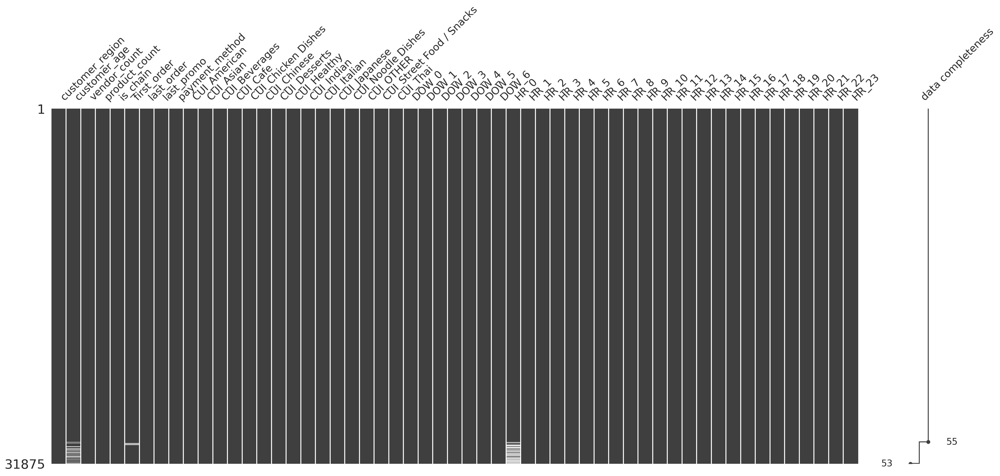

In [16]:
# Visualize the missing values in the dataset
msno.matrix(df, labels=True, sort="descending");

In [17]:
# Check the missing values in rows instead of columns
df.isnull().sum(axis=1).value_counts().sort_index(ascending=False)

,count
2,30
1,1937
0,29908


In [18]:
#there are 3 columns with NaN values, we will treat all of them as it is necessary for data visualization
df.isna().sum()

,0
customer_region,0
customer_age,727
vendor_count,0
product_count,0
is_chain,0
first_order,106
last_order,0
last_promo,0
payment_method,0
CUI_American,0


#### customer_Age

In [19]:
# Copy the data
df = df.copy(deep=True)                                  # deep=True to avoid the SettingWithCopyWarning

# Init the transformer
knn_imp = KNNImputer()                                               # k=5 is the default

# Fit/transform
df["customer_age"] = knn_imp.fit_transform(df[["customer_age"]])

# Check if KNN Imputer worked correctly
df.customer_age.describe()

## Time of Execution KNNImputer: 1.8s

,customer_age
count,31875.000000
mean,27.507545
std,7.079682
min,15.000000
25%,23.000000
50%,26.000000
75%,31.000000
max,80.000000


In [20]:
df.columns[df.isnull().sum()>0]


Index(['first_order', 'HR_0'], dtype='object')

#### first_order

In [21]:
# we suspect that NaNs for first_order just did their first_order today
print(df[df['first_order'].isna()]['last_order'].value_counts()) # as we can see all last_order is set to 0
print(df[df['first_order'].isna()]
      [['DOW_0','DOW_1','DOW_2','DOW_3','DOW_4','DOW_5','DOW_6']].value_counts())
# we can even see that the dataset was concluded on a sunday
# given this information, we will set these NaNs as the day next to the max value in the 'first_order' values

last_order
0    106
Name: count, dtype: int64
DOW_0  DOW_1  DOW_2  DOW_3  DOW_4  DOW_5  DOW_6
0      0      0      0      0      0      1        104
                                          2          2
Name: count, dtype: int64


In [22]:
# given this information, we will set these NaNs as the day next to the max value in the 'first_order' values
df['first_order'].max()

90.0

In [23]:
df['first_order'].fillna(91, inplace=True)

#### HR_0

In [24]:
# for HR_0
Total_Orders_Week = df.iloc[:, 24:31].sum(axis=1) #sum all DOW columns
Total_Orders_Hour = df.iloc[:, 32:].sum(axis=1) #sum all HR columns, dont count HR_0 as it is full of zeros
df['HR_0'] = Total_Orders_Week - Total_Orders_Hour

In [25]:
df.isna().sum()

,0
customer_region,0
customer_age,0
vendor_count,0
product_count,0
is_chain,0
first_order,0
last_order,0
last_promo,0
payment_method,0
CUI_American,0


In [26]:
hourly_counts = {}

for hour in range(24):
    column_name = f'HR_{hour}'
    if column_name in df.columns:
        hourly_counts[column_name] = df[column_name].value_counts()

# Combine all hourly counts into a single DataFrame
combined_counts = pd.DataFrame(hourly_counts).fillna(0).astype(int)

# Calculate total counts for each hour
total_counts = combined_counts.sum()

# Add total counts as the first row
combined_counts = pd.concat([pd.DataFrame(total_counts, columns=['Total']).T, combined_counts])

# Sort the remaining rows (excluding the 'Total' row) in descending order
combined_counts.iloc[1:] = combined_counts.iloc[1:].sort_values(
    by=combined_counts.columns.tolist(), ascending=False
)

# Display the combined counts
print(combined_counts)

#check if values are in line with surrounding areas - they are
print(combined_counts.describe().transpose())

        HR_0   HR_1   HR_2   HR_3   HR_4   HR_5   HR_6   HR_7   HR_8   HR_9  \
Total  31875  31875  31875  31875  31875  31875  31875  31875  31875  31875   
0      30711  30592  30385  29354  29507  29849  30125  29982  28923  26952   
1        934   1016   1173   1783   1822   1615   1419   1541   2293   3557   
2        159    181    219    464    376    303    244    262    439    829   
3         39     46     60    163    101     63     59     54    114    280   
4         15     24     14     53     32     28     15     18     44    122   
5          8      7      8     26     18     15      7      5     27     59   
6          2      4      5     16      7      0      3      3     10     26   
7          2      1      1      1      1      0      0      1      2     13   
8          1      2      3      8      5      2      2      2     11     15   
9          1      1      4      2      3      0      1      3      2      8   
10         1      0      2      0      0      0     

In [27]:
# Check the missing values in rows again
df.isnull().sum(axis=1).value_counts().sort_index(ascending=False)

,count
0,31875


In [28]:
# We identified rows with 0s in vendor_count and product_count
zero_vendor = (df['vendor_count'] == 0).sum()
zero_product = (df['product_count'] == 0).sum()
print(f'Number of clients with 0 vendor_count: {zero_vendor}\nNumber of clients with 0 product_count: {zero_product}')

Number of clients with 0 vendor_count: 138
Number of clients with 0 product_count: 156


In [29]:
# Investigate the rows where 'product_count' has a value of 0
no_product = df.index[df['product_count'] == 0].tolist()
df.loc[no_product]
# There are rows where product_count == 0 even though the order has been placed

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
1449,8670,22.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,...,0,0,0,0,0,0,0,0,0,0
1476,8670,26.0,0,0,0,1.0,1,DELIVERY,CASH,0.0,...,0,0,0,0,0,0,0,0,0,0
1488,8670,21.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,...,0,0,0,0,0,0,0,0,0,0
2486,8670,38.0,0,0,0,2.0,2,DELIVERY,CASH,0.0,...,0,0,0,0,0,0,0,0,0,0
3391,8670,24.0,0,0,0,3.0,3,-,CASH,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31553,8670,22.0,0,0,1,88.0,88,DISCOUNT,CARD,0.0,...,0,0,0,0,0,0,0,0,0,0
31667,8670,23.0,0,0,0,89.0,89,DISCOUNT,CARD,0.0,...,0,0,0,0,0,0,0,0,0,0
31680,8670,20.0,0,0,0,89.0,89,DELIVERY,DIGI,0.0,...,0,0,0,0,0,0,0,0,0,0
31695,8670,25.0,0,0,1,89.0,89,-,CASH,0.0,...,0,0,0,0,0,0,0,0,0,0


In [30]:
# We decided to delete these rows because having clients with no orders in the data set doesnt make sense
indexes = df.index[df['vendor_count'] == 0].tolist()
df = df.drop(index=indexes)
(df['vendor_count'] == 0).sum()

0

In [31]:
# For the missing product_count values we make an assumption that it is error in the data set
# If the vendor_count is different than 0, we will change the product_count to 1
df['product_count'] = df.apply(lambda row: 1 if row['product_count'] == 0 and row['vendor_count'] != 0 else row['product_count'], axis=1)

#Check if it worked
(df['product_count'] == 0).sum()

0

<hr>
<a class="anchor" id="redefiningvariables">
    
## 4.3 Redefining Variables
    
</a>

**Redefining DataTypes**

In [32]:
#age, first_order and HR_0 should be integers, the rest seems correct
df['customer_age'] = df['customer_age'].astype('int64')
df['first_order'] =df['first_order'].astype('int64')
df['HR_0'] =df['HR_0'].astype('int64')
df.dtypes

,0
customer_region,object
customer_age,int64
vendor_count,int64
product_count,int64
is_chain,int64
first_order,int64
last_order,int64
last_promo,object
payment_method,object
CUI_American,float64


**Redefining Names**

In [33]:
df.rename(columns={'CUI_Chicken Dishes': 'CUI_Chicken_Dishes'}, inplace=True)
df.rename(columns={'CUI_Noodle Dishes': 'CUI_Noodle_Dishes'}, inplace=True)
df.rename(columns={'CUI_Street Food / Snacks': 'CUI_Street_Food/Snacks'}, inplace=True)

**Redefining Variables**

##### last_order

In [34]:
df['last_order'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8, 10, 11, 12, 13, 14, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
       37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
       71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87,
       88, 89, 90,  9, 15,  0])

In [35]:
# there should not be 0 in last_order, it is due to the same reason for the missing values on first_order
print(df[df['last_order']  == 0]['first_order'].value_counts()) # the zeros appear on the day of the dataset snapshot

first_order
91    106
Name: count, dtype: int64


In [36]:
# we should just add 1 to the max of last_order for the rows that appear zero
df_last_order = df[['last_order']]
df_last_order[df_last_order == 0] = 91
df['last_order'] = df_last_order['last_order']
df.tail(10)

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
31878,8670,23,1,1,1,91,91,DELIVERY,CARD,0.00,...,0,0,0,0,0,0,0,0,0,0
31879,8670,24,1,1,0,91,91,DELIVERY,CARD,0.00,...,0,0,0,0,0,0,0,0,0,0
31880,4660,23,1,1,0,91,91,-,CARD,0.00,...,0,1,0,0,0,0,0,0,0,0
31881,8670,32,1,1,1,91,91,FREEBIE,CASH,0.00,...,0,0,0,0,0,0,0,0,0,0
31882,8670,21,1,1,1,91,91,DELIVERY,DIGI,0.00,...,0,0,0,0,0,0,0,0,0,0
31883,8670,30,1,1,1,91,91,FREEBIE,DIGI,0.00,...,0,0,0,0,0,0,0,0,0,0
31884,8670,27,1,1,0,91,91,DELIVERY,DIGI,18.04,...,0,0,1,0,0,0,0,0,0,0
31885,8670,24,1,1,1,91,91,-,DIGI,0.00,...,0,0,0,0,0,0,0,0,0,0
31886,8670,34,1,1,0,91,91,DISCOUNT,DIGI,0.00,...,0,0,0,0,0,0,0,0,0,0
31887,4660,30,1,1,0,91,91,-,CASH,0.00,...,0,0,1,0,0,0,0,0,0,0


<hr>
<a class="anchor" id="eda">
    
# 5.Exploratory Data Analysis
    
</a>

<hr>
<a class="anchor" id="datacategorization">
    
## 5.1 Data Categorization
    
</a>

***Days of The Week***

In [37]:
days_of_week = df[['DOW_0', 'DOW_1','DOW_2','DOW_3','DOW_4','DOW_5','DOW_6']]

***Hours of The Day***

In [38]:
hours_of_day = df[['HR_0','HR_1','HR_2','HR_3','HR_4','HR_5','HR_6','HR_7','HR_8','HR_9','HR_10','HR_11','HR_12','HR_13','HR_14','HR_15',
                   'HR_16','HR_17','HR_18','HR_19','HR_20','HR_21','HR_22','HR_23']]

***Cuisines***

In [39]:
cuisines = df[['CUI_Asian', 'CUI_American', 'CUI_Beverages', 'CUI_Cafe', 'CUI_Chicken_Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy', 'CUI_Indian'
               , 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle_Dishes', 'CUI_OTHER', 'CUI_Street_Food/Snacks', 'CUI_Thai']]

***Categorical Variables***

In [40]:
cat_variables = df[['customer_region', 'last_promo', 'payment_method']]

***Metric Variables***

In [41]:
#excluding hours and days
metric_variables = df[['customer_age', 'vendor_count', 'product_count', 'is_chain', 'first_order', 'last_order']]
#including hours and days
numeric_df = df.select_dtypes(include=['int64', 'float64'])

<hr>
<a class="anchor" id="datacategorization">
    
## 5.2 Feature Analysis
    
</a>

### Histograms

In [42]:
# Function to create a histogram
def create_histogram(data, title, xlabel, ylabel, color='#3498DB', bins=50, edgecolor='black', range=range):
    plt.figure(figsize=(7, 5))
    plt.hist(data, bins=bins, color=color, range=range)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel(xlabel, fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.tight_layout()
    plt.show()

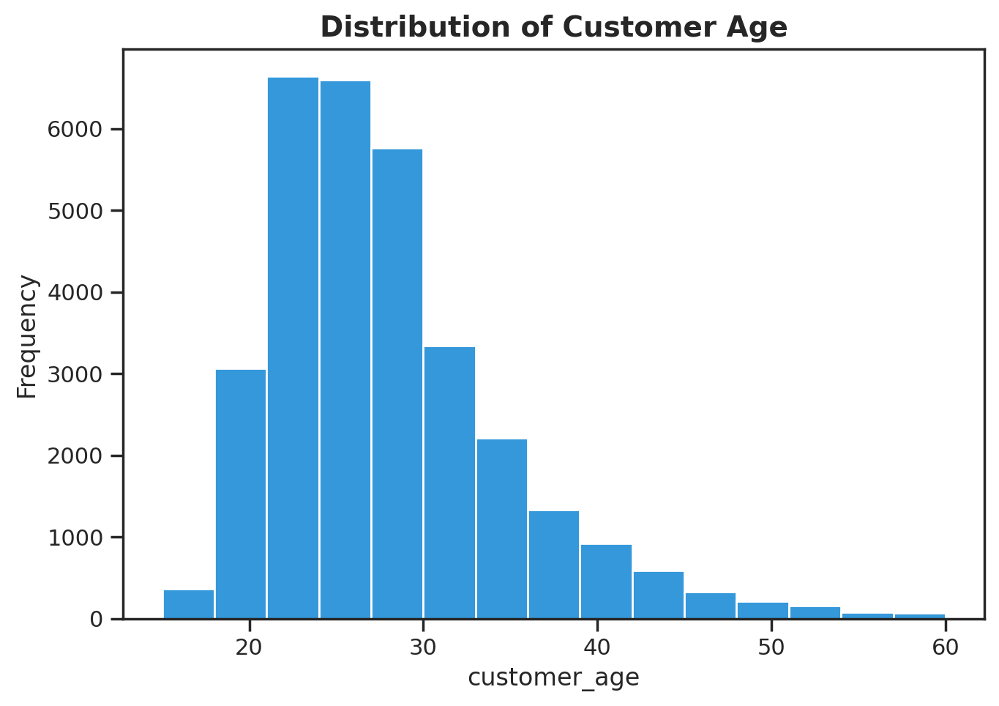

<Figure size 640x480 with 0 Axes>

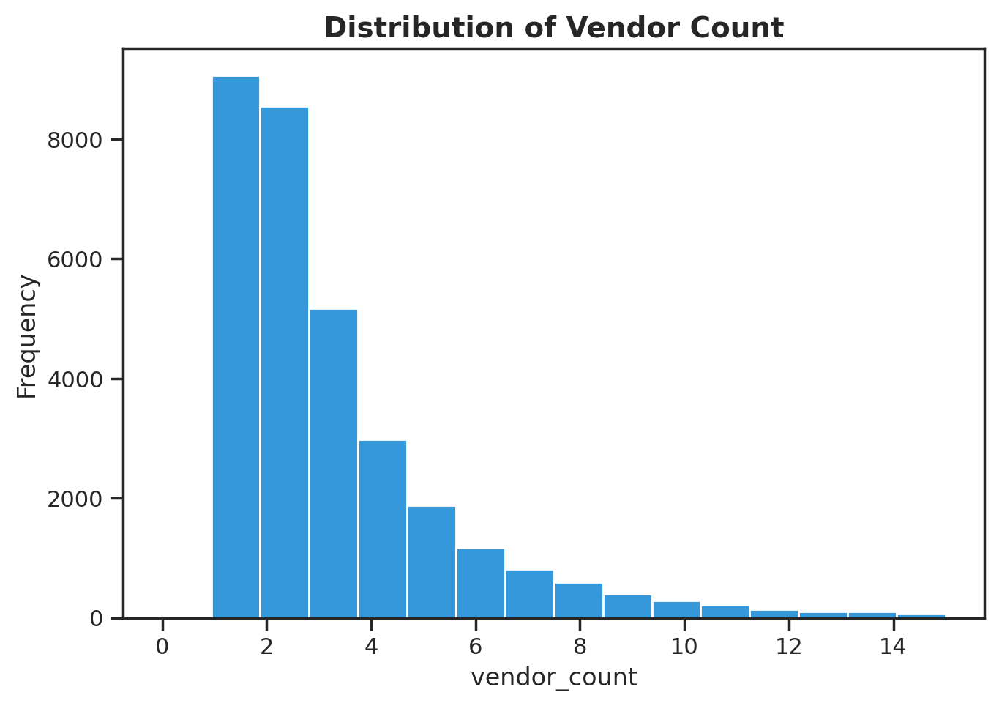

<Figure size 640x480 with 0 Axes>

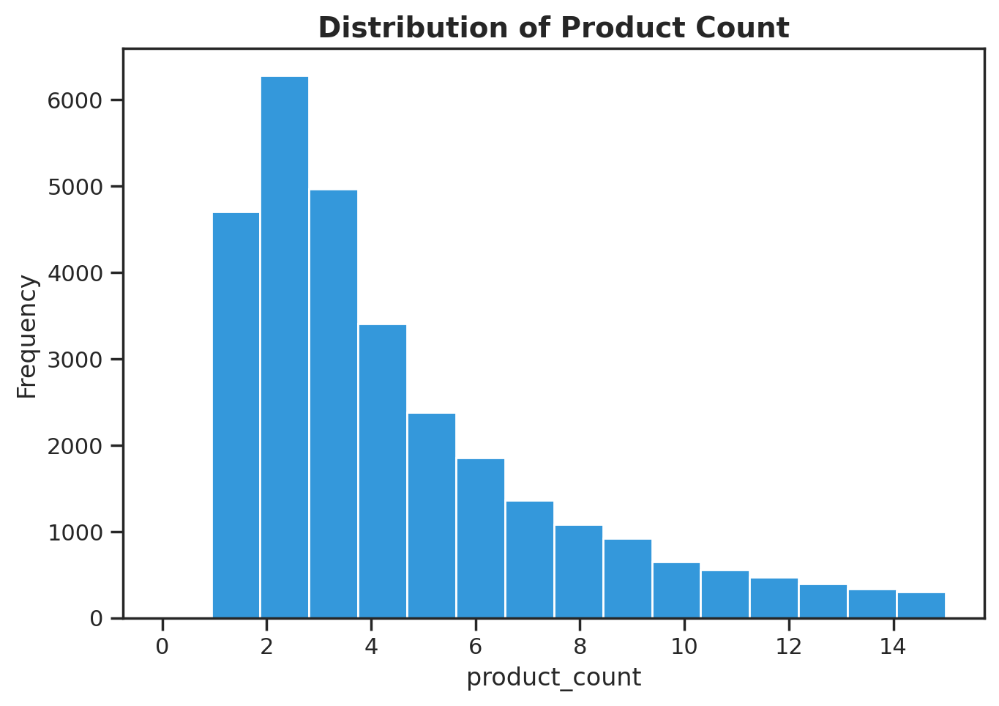

<Figure size 640x480 with 0 Axes>

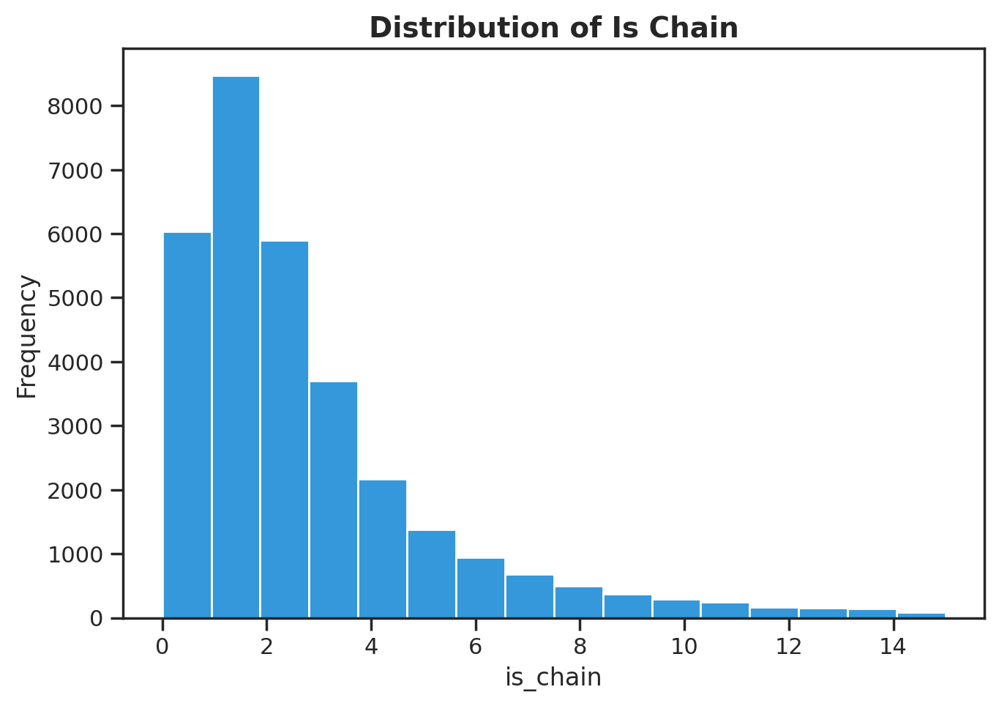

<Figure size 640x480 with 0 Axes>

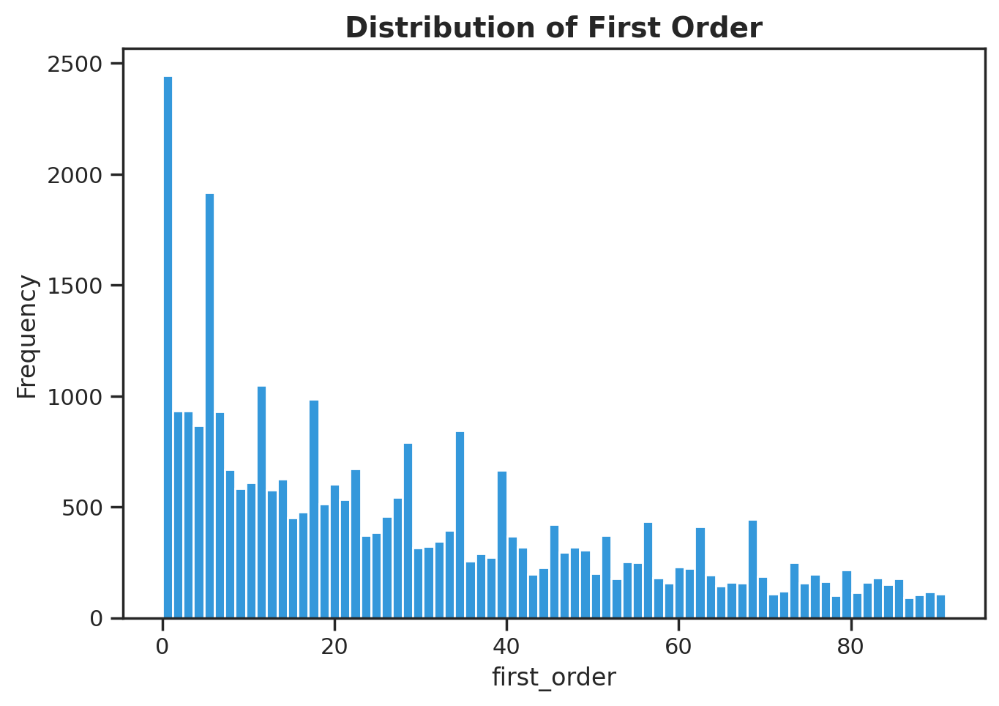

<Figure size 640x480 with 0 Axes>

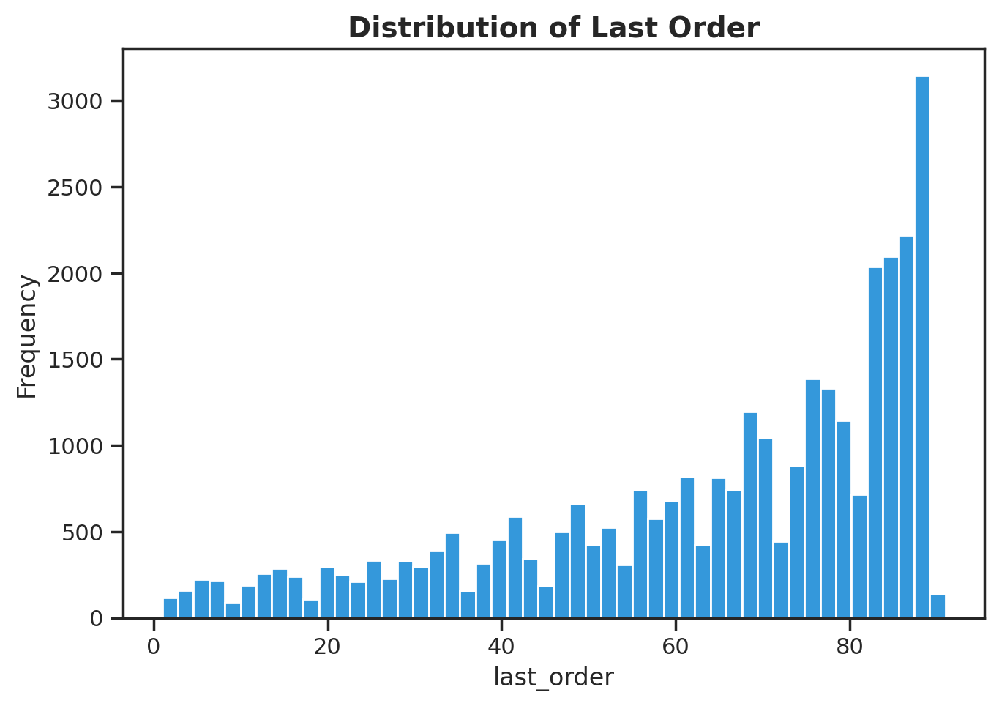

<Figure size 640x480 with 0 Axes>

In [43]:
bin_config = dict([
    ('customer_age', 15),
    ('vendor_count', 16),
    ('product_count', 16),
    ('first_order', 75),
    ('last_order', 50),
    ('is_chain', 16),
])
range_config = dict([
    ('customer_age', (15, 60)),
    ('vendor_count', (0, 15)),
    ('product_count', (0, 15)),
    ('first_order', None),
    ('last_order', None),
    ('is_chain', (0, 15)),
])
sns.set_style('ticks')
for var in metric_variables:
    title = f'Distribution of {var.replace("_", " ").title()}'
    bins = bin_config.get(var,50)
    range_tuple = range_config.get(var, (df[var].min(), df[var].max()))
    create_histogram(df[var], title, var, 'Frequency', bins = bins, range=range_tuple)
    plt.savefig('f{.png')

In [44]:
#function to plot time distributions, both hours and days of week
def plot_time_distribution(df, time_cols, title, color='#3498DB'):
    """
    Plot distribution for time-based columns with improved y-axis scaling.
    """
    counts = [df[col].sum() for col in time_cols]

    plt.figure(figsize=(12, 6))
    plt.bar(range(len(counts)), counts, color='#3498DB')
    plt.title(title,fontsize=14, fontweight='bold')

    if len(counts) == 24:  # Hours
        plt.xlabel('Hour of Day')
        plt.xticks(range(24))
        # Set y-axis limits to focus on the meaningful range
        min_count = min(counts) * 0.9
        max_count = max(counts) * 1.1
        plt.ylim(min_count, max_count)
    elif len(counts) == 7:  # Days
        plt.xlabel('Day of Week (0 = Monday, 6 = Sunday)')
        plt.xticks(range(7))
        # Set y-axis limits for days
        min_count = min(counts) * 0.95
        max_count = max(counts) * 1.05
        plt.ylim(min_count, max_count)

    plt.ylabel('Count')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

In [45]:
#function to plot cuisine types
def plot_cuisine_distribution(df, cuisine_columns, title='Distribution of Cuisine Types'):
    """
    Plot distribution of cuisine types with improved formatting.
    """
    cuisine_counts = [df[cuisine].sum() for cuisine in cuisine_columns]

    # Sort cuisines by count for better visualization
    sorted_indices = np.argsort(cuisine_counts)[::-1]
    sorted_counts = [cuisine_counts[i] for i in sorted_indices]
    sorted_cuisines = [cuisine_columns[i] for i in sorted_indices]

    plt.figure(figsize=(12, 6))
    bars = plt.bar(range(len(sorted_cuisines)), sorted_counts, color='#3498DB')
    plt.title(title,fontsize=14, fontweight='bold')
    plt.xlabel('Cuisine Type')
    plt.ylabel('Count')

    # Rotate labels and adjust their position
    plt.xticks(range(len(sorted_cuisines)),
               [cuisine.replace('CUI_', '').replace('_', ' ') for cuisine in sorted_cuisines],
               rotation=45,
               ha='right')

    # Add value labels on top of bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height):,}',
                ha='center', va='bottom')

    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

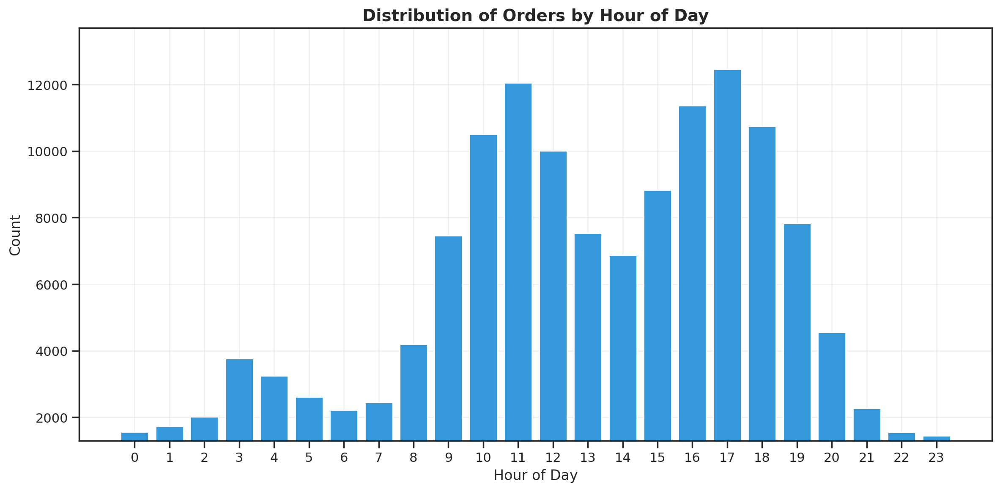

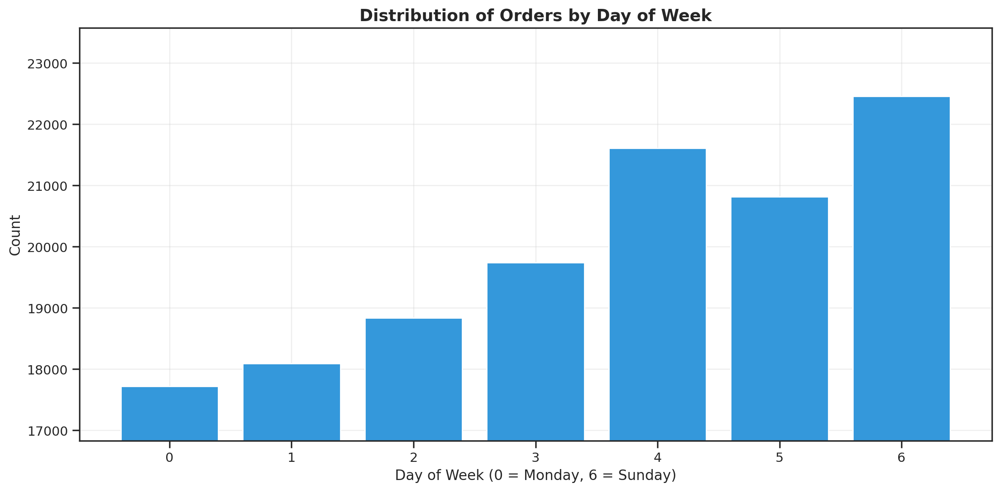

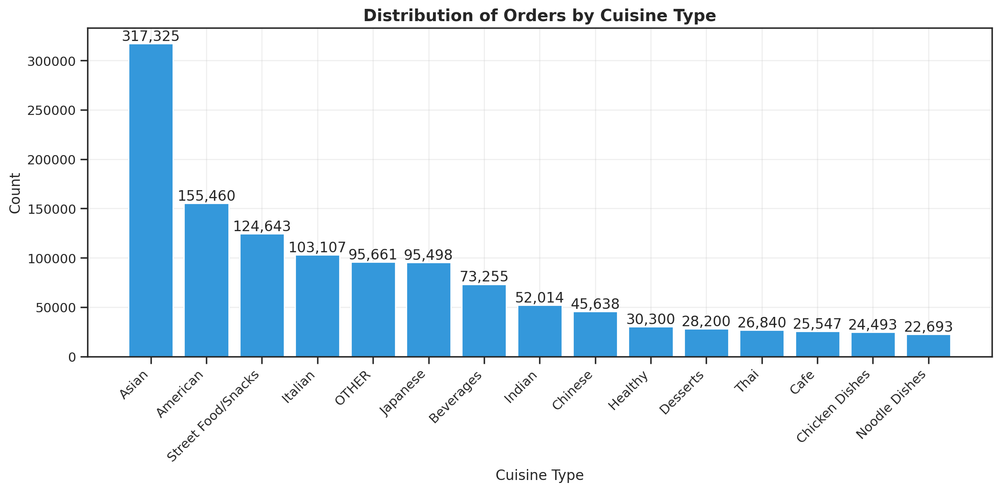

In [46]:
def visualize_all_distributions(df):
    """
    Create all visualizations for the dataset with optimized scaling.
    """    # Time-based distributions
    hour_cols = [f'HR_{i}' for i in range(24)]
    if all(col in df.columns for col in hour_cols):
        plot_time_distribution(df, hour_cols, 'Distribution of Orders by Hour of Day', 'skyblue')

    day_cols = [f'DOW_{i}' for i in range(7)]
    if all(col in df.columns for col in day_cols):
        plot_time_distribution(df, day_cols, 'Distribution of Orders by Day of Week', 'skyblue')

    # Cuisine distribution
    cuisine_cols = [col for col in df.columns if col.startswith('CUI_')]
    if cuisine_cols:
        plot_cuisine_distribution(df, cuisine_cols,'Distribution of Orders by Cuisine Type')

visualize_all_distributions(df)

### BoxPlots

In [47]:
# Calculate the number of rows and columns for the subplots
n_vars = len(numeric_df.columns)
n_rows = (n_vars + 3) // 4  # 4 plots per row, rounded up
n_cols = min(n_vars, 4)

# Create the subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 5*n_rows))
fig.suptitle('Boxplots of Numeric Variables', fontsize=16)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Create a boxplot for each numeric variable
for i, column in enumerate(numeric_df.columns):
    sns.boxplot(x=numeric_df[column], ax=axes[i])
    axes[i].set_title(column, fontweight='bold')
    axes[i].set_xlabel('')

# Remove any unused subplots
for i in range(n_vars, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

### Pie Charts

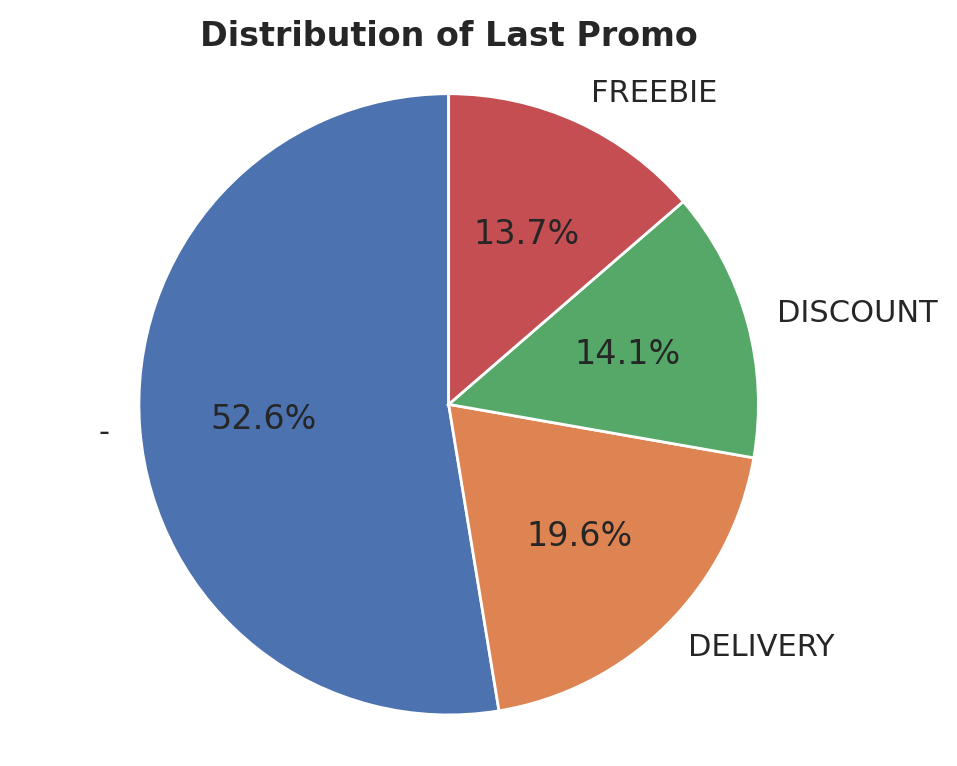

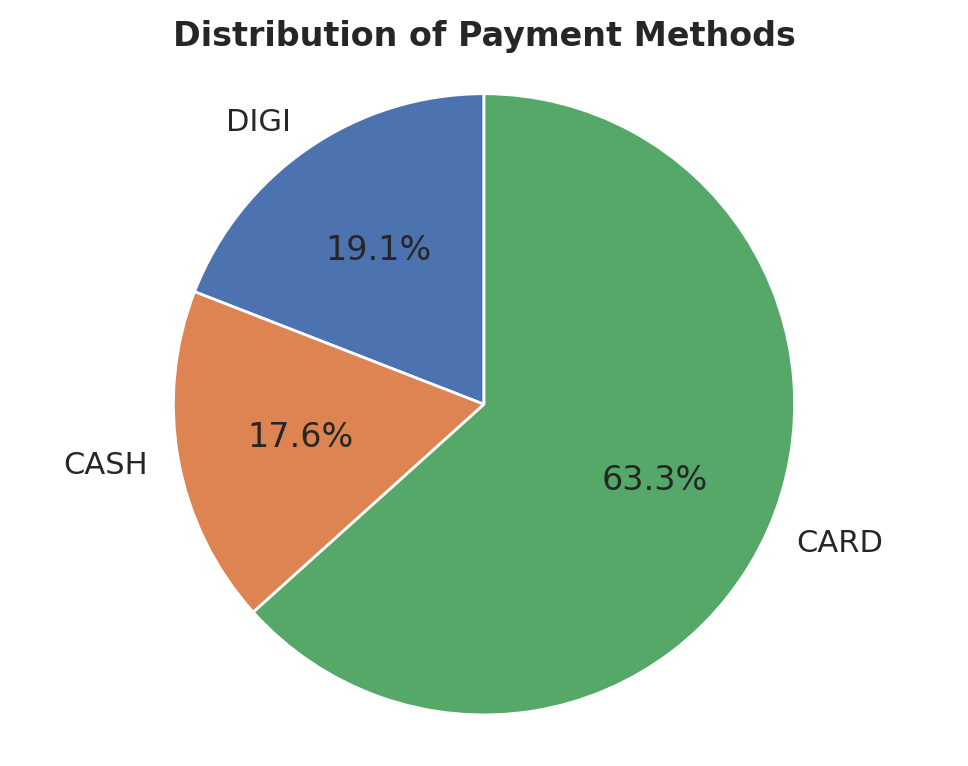

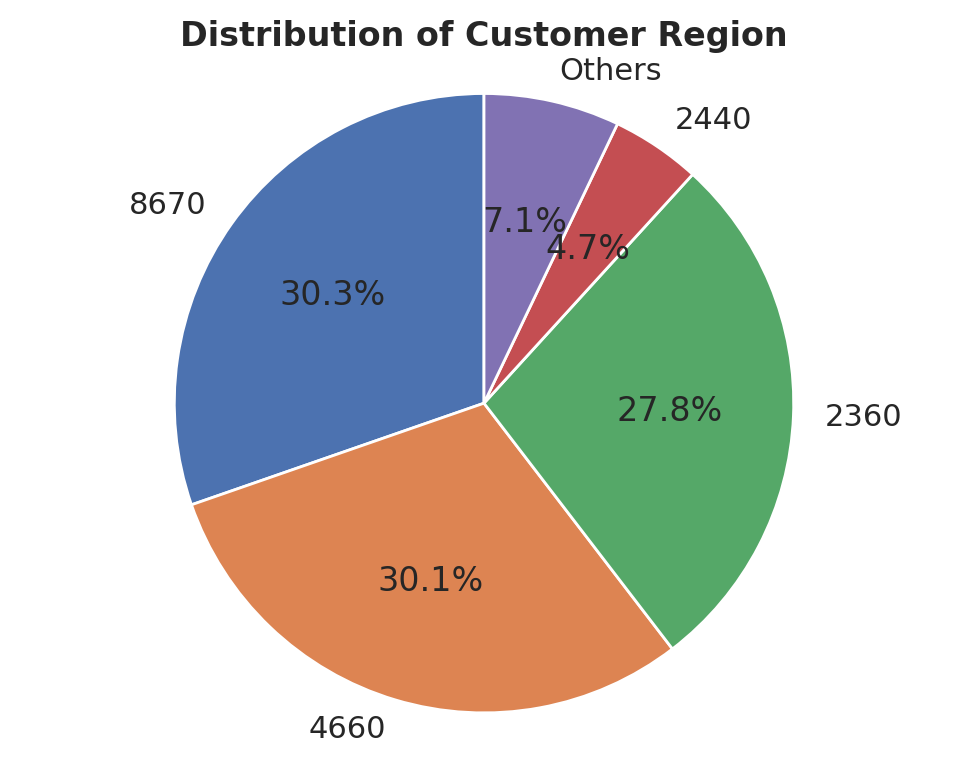

In [48]:
# Pie chart for last_promo
last_promo_counts = df['last_promo'].value_counts()
plt.figure(figsize=(5, 4))
plt.pie(last_promo_counts.values, labels=last_promo_counts.index.astype(str), autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Last Promo', fontweight='bold')
plt.axis('equal')
plt.tight_layout()
plt.show()

# Pie chart for payment method
payment_methods = ['DIGI', 'CASH', 'CARD']
payment_counts = [df[df['payment_method'] == method].shape[0] for method in payment_methods]

plt.figure(figsize=(5, 4))
plt.pie(payment_counts, labels=payment_methods, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Payment Methods', fontweight='bold')
plt.axis('equal')
plt.tight_layout()
plt.show()

#Pie chart for customer_region
customer_region_counts = df['customer_region'].value_counts()
threshold = 0.04
others_value = customer_region_counts[customer_region_counts / sum(customer_region_counts) < threshold].sum()
customer_region_counts = customer_region_counts[customer_region_counts / sum(customer_region_counts) >= threshold]
customer_region_counts.loc['Others'] = others_value
plt.figure(figsize=(5, 4))
plt.pie(customer_region_counts.values, labels=customer_region_counts.index.astype(str), autopct=lambda p : '{:.1f}%'.format(p) if p >= 4 else ''
        , startangle=90)
plt.title('Distribution of Customer Region', fontweight='bold')
plt.axis('equal')
plt.tight_layout()
plt.show()

### Correlation Matrix

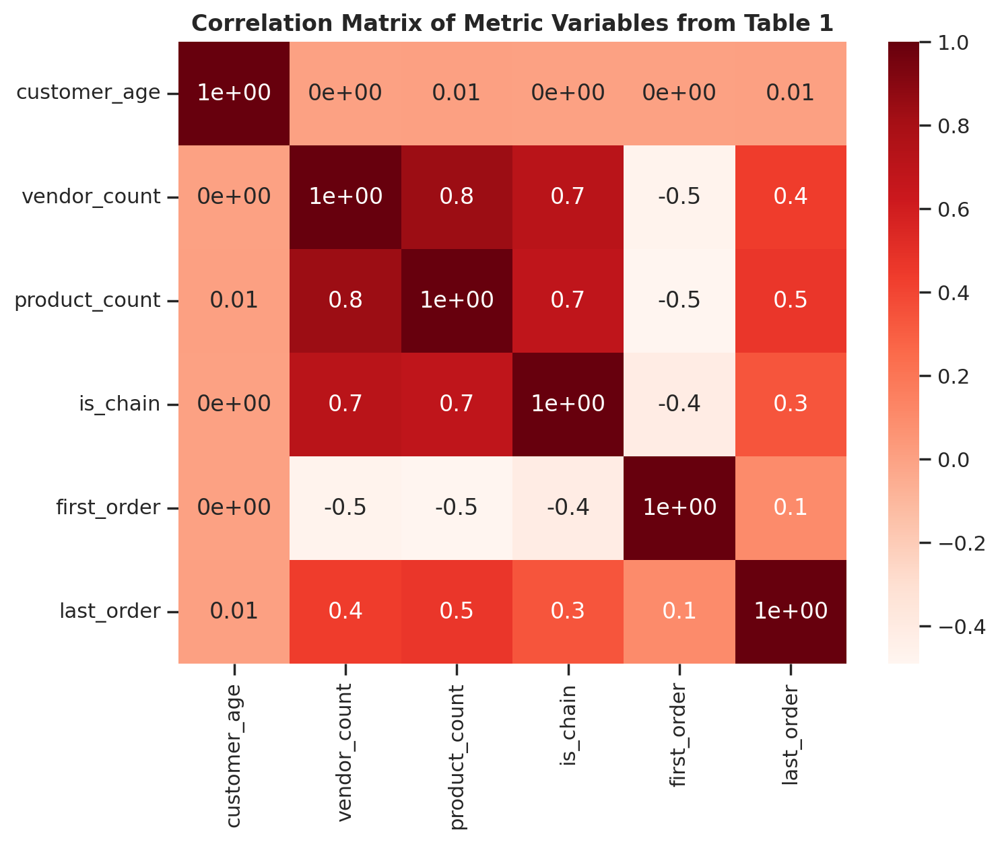

In [49]:
corr_metric = metric_variables.corr(method = 'spearman').round(2)
plt.figure(figsize=(8,6))
plt.title('Correlation Matrix of Metric Variables from Table 1', fontsize = '12', fontweight='bold')
sns.heatmap(data = corr_metric, annot = True, cmap = plt.cm.Reds, fmt='.1')
plt.show()

### Violin Plots

In [50]:
# Calculate the number of rows and columns for the subplots
n_vars = len(numeric_df.columns)
n_rows = (n_vars + 3) // 4  # 4 plots per row, rounded up
n_cols = min(n_vars, 4)

# Create the subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 5*n_rows))
fig.suptitle('Violin Plots of Numeric Variables', fontsize=16)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Create a violin plot for each numeric variable
for i, column in enumerate(numeric_df.columns):
    sns.violinplot(y=numeric_df[column], ax=axes[i])
    axes[i].set_title(column, fontweight='bold')
    axes[i].set_xlabel('')

    # Rotate x-axis labels if they're too long
    axes[i].tick_params(axis='x', rotation=45)

# Remove any unused subplots
for i in range(n_vars, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

## Bivariate Analysis

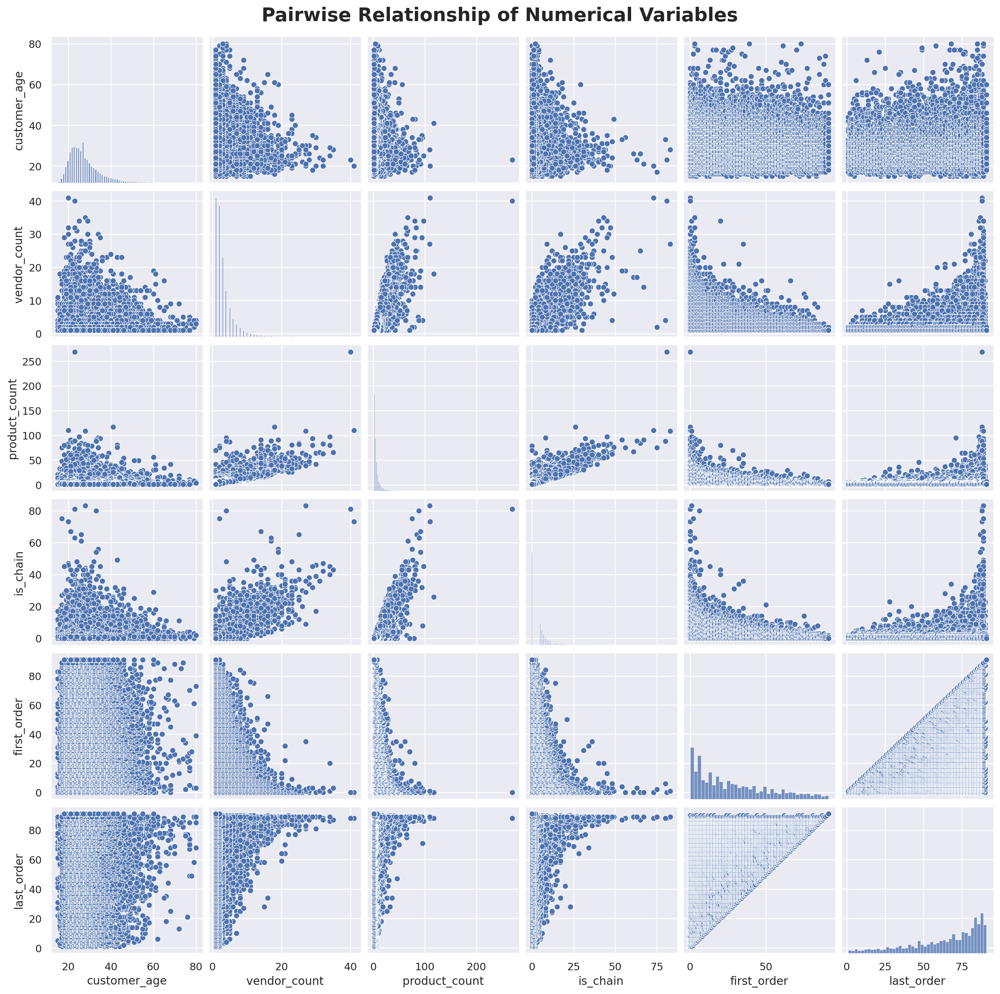

In [51]:
# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(metric_variables, diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20, fontweight='bold')

# if the eda directory is not present then create it first
if not os.path.exists(os.path.join('..', 'figures', 'eda')):
    os.makedirs(os.path.join('..', 'figures', 'eda'))

plt.savefig(os.path.join('..', 'figures', 'eda', 'pairwise_numeric_scatterplots.png'), dpi=200)
plt.show()

<hr>
<a class="anchor" id="newfeature">
    
## 5.3 New Feature Creation
    
</a>

#### Total Orders Per Client

In [52]:
df['Total_Orders_Per_Client'] = Total_Orders_Week

#### Total Spent Per Client

In [53]:
df['mnt'] = cuisines.sum(axis=1)

#### Amount Spent Per Order

In [54]:
df['mnt_Per_Order'] = (df['mnt']/df['Total_Orders_Per_Client']).round(2)

#### Amount of Items Per Order

In [55]:
df['Items_Per_Order'] = (df['product_count']/df['Total_Orders_Per_Client'])

#### Frequency

In [56]:
df['last_order'].max()

91

In [57]:
#i think we cannot calculate it like this
df['frq'] = (df['Total_Orders_Per_Client']/(df['last_order']-df['first_order']+1))

#### Recency

In [58]:
#we use 91 as the day for today
today = 91
df['rcn'] = today - df['last_order']

#### Activity

In [59]:
df['activity'] = df['last_order'] - df['first_order'] + 1

#### Cuisine Diversity Index

In [60]:
df['CUI_diversity'] = cuisines.apply(lambda row: sum(row != 0), axis='columns')

#### Loyalty

In [61]:
# we callculate loyalty score to understand clients preferences for vendors
df['Loyalty'] = (df['Total_Orders_Per_Client']-df['vendor_count'])/df['Total_Orders_Per_Client']

#### Time Periods

In [62]:
    # Time periods (4 hours each)
    time_periods = {
        'Night': ['HR_0', 'HR_1', 'HR_2', 'HR_3'],         # 12-4am
        'Dawn': ['HR_4', 'HR_5', 'HR_6', 'HR_7'],          # 4-8am
        'Morning': ['HR_8', 'HR_9', 'HR_10', 'HR_11'],     # 8am-12pm
        'Afternoon': ['HR_12', 'HR_13', 'HR_14', 'HR_15'], # 12-4pm
        'Evening': ['HR_16', 'HR_17', 'HR_18', 'HR_19'],   # 4-8pm
        'Dusk': ['HR_20', 'HR_21', 'HR_22', 'HR_23']       # 8pm-12am
    }

#### Age Groups

In [63]:
# Age grouping
age_bins = [0, 17, 24, 34, 44, 54, float('inf')]  # Use float('inf') for open-ended upper limit
age_labels = ['<18', '18-24', '25-34', '35-44', '45-54', '55+']
df['Age_Group'] = pd.cut(df['customer_age'], bins=age_bins, labels=age_labels)

#### CLV

In [64]:
    # CLV Score calculation
    recency_weight = 0.33
    frequency_weight = 0.33
    monetary_weight = 0.33

    # Normalize each component
    df['Recency_Score'] = 1 / (1 + df['rcn'])  # Higher score for more recent orders
    df['Frequency_Score'] = df['frq'] / df['frq'].max()
    df['Monetary_Score'] = df['mnt'] / df['mnt'].max()

    # Composite CLV score
    df['CLV_Score'] = (
        recency_weight * df['Recency_Score'] +
        frequency_weight * df['Frequency_Score'] +
        monetary_weight * df['Monetary_Score']
    )

<hr>
<a class="anchor" id="newfeatureanal">
    
## 5.4 New Feature Analysis
    
</a>

In [65]:
new_variables = ['Loyalty', 'CUI_diversity', 'activity', 'rcn', 'frq', 'Items_Per_Order', 'Total_Orders_Per_Client', 'mnt_Per_Order', 'mnt']
df[new_variables].describe()

,Loyalty,CUI_diversity,activity,rcn,frq,Items_Per_Order,Total_Orders_Per_Client,mnt_Per_Order,mnt
count,31737.000000,31737.000000,31737.00000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000
mean,0.161804,2.285156,36.45061,26.941015,0.354685,1.299464,4.388033,10.305976,38.462376
std,0.229567,1.480498,29.40898,22.939355,0.414692,0.417393,5.087637,7.862201,46.442549
min,0.000000,1.000000,1.00000,0.000000,0.022222,1.000000,1.000000,0.370000,0.370000
25%,0.000000,1.000000,4.00000,8.000000,0.076923,1.000000,2.000000,5.070000,13.020000
50%,0.000000,2.000000,35.00000,20.000000,0.134328,1.166667,3.000000,8.220000,24.200000
75%,0.333333,3.000000,63.00000,41.000000,0.600000,1.500000,5.000000,12.920000,45.180000
max,0.973333,13.000000,91.00000,90.000000,4.000000,6.000000,94.000000,104.320000,1418.330000


### Histograms

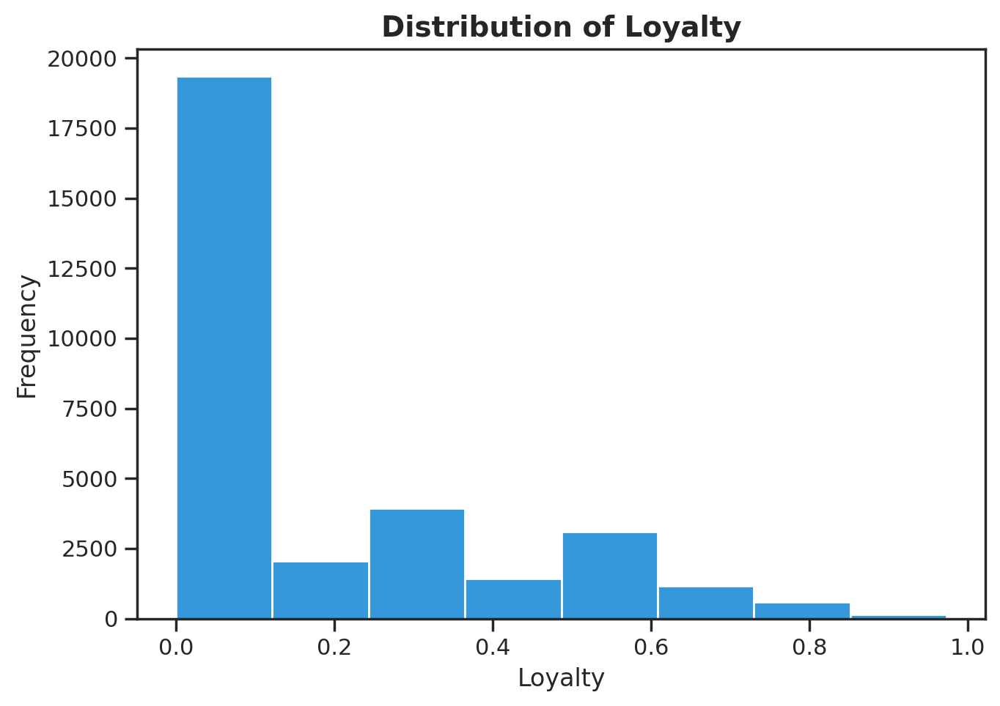

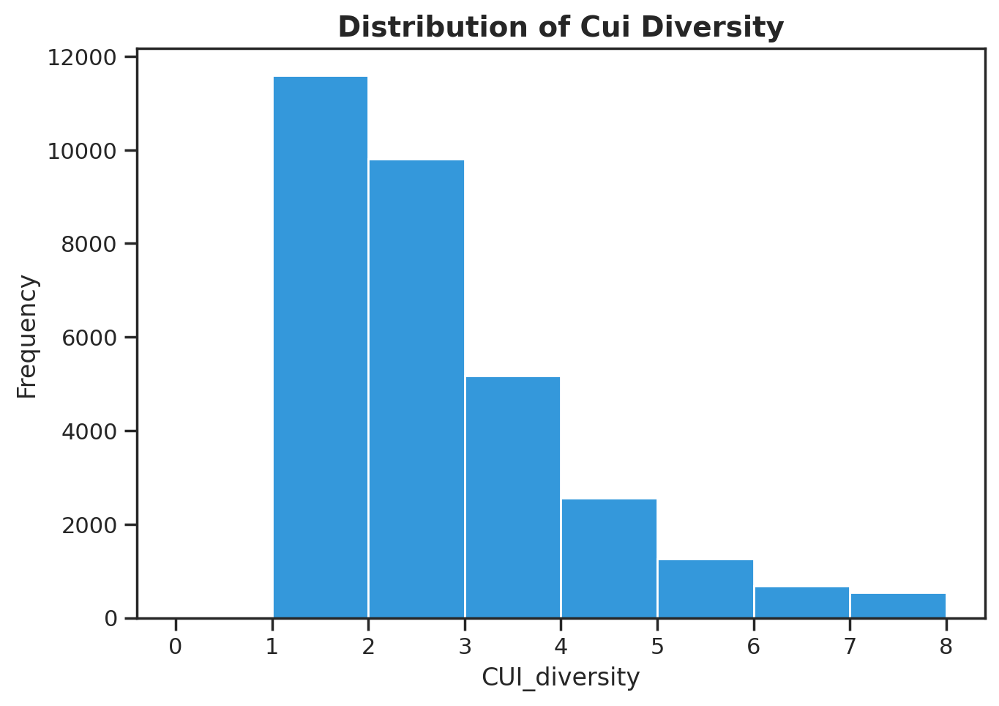

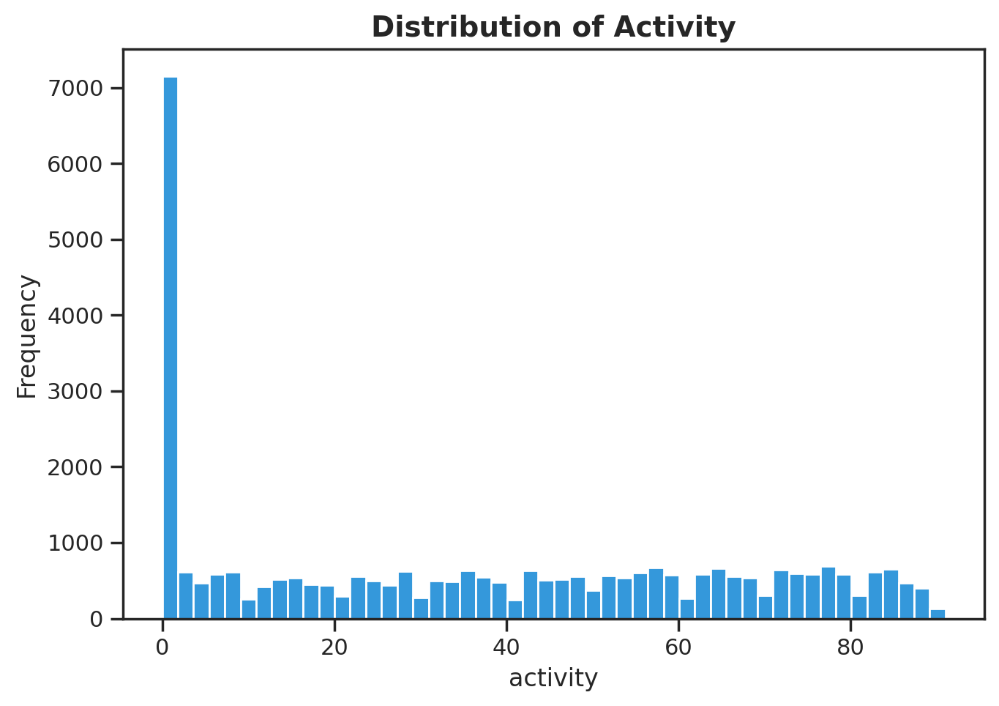

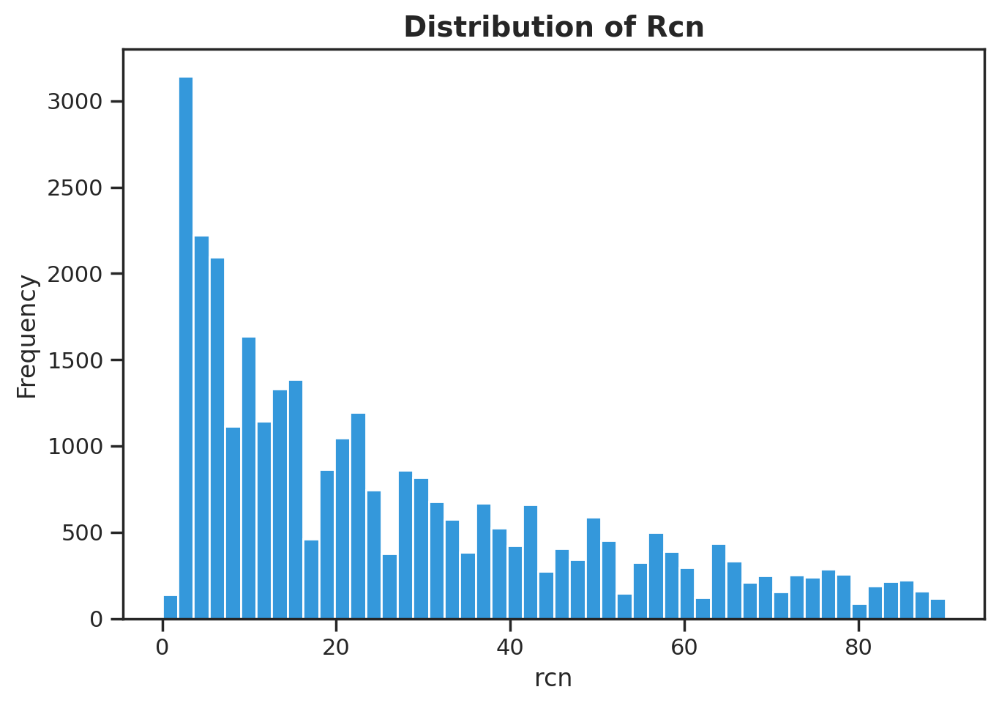

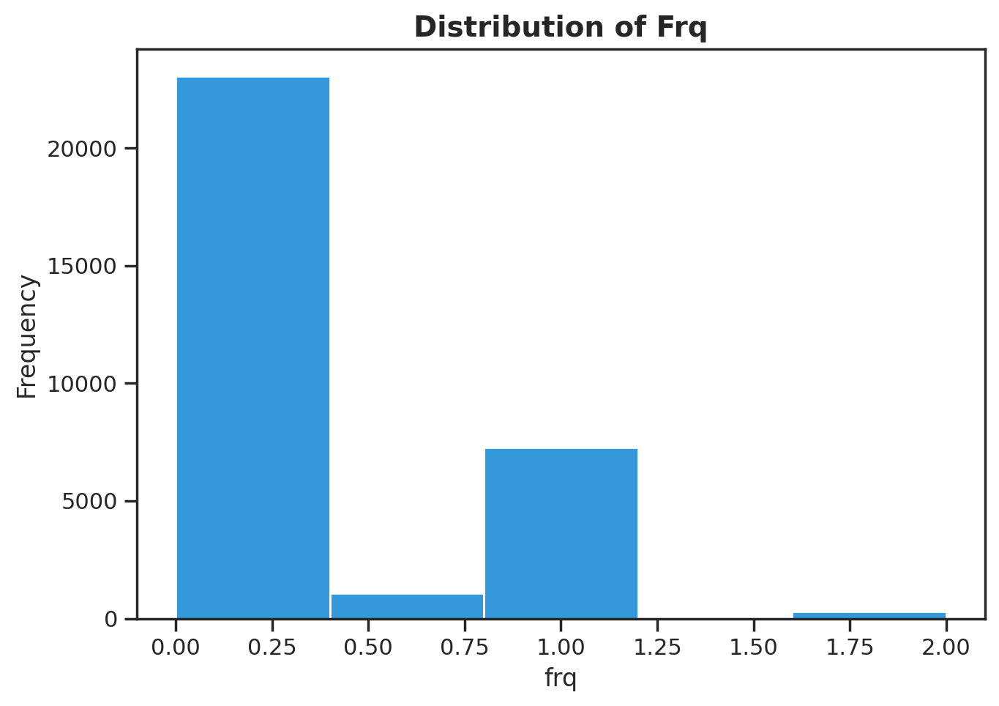

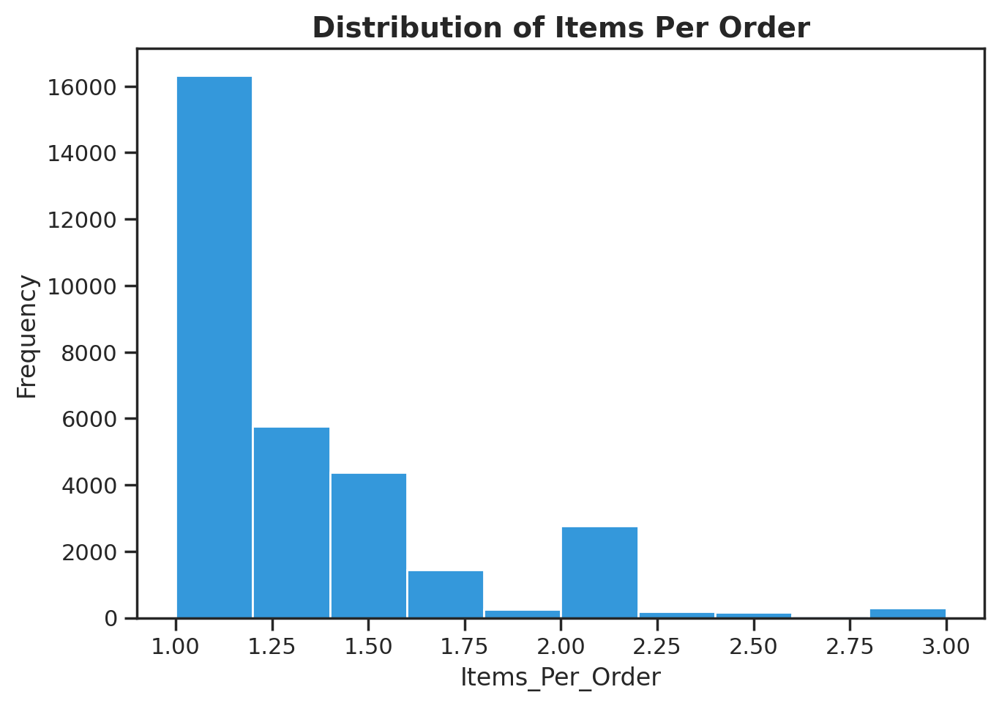

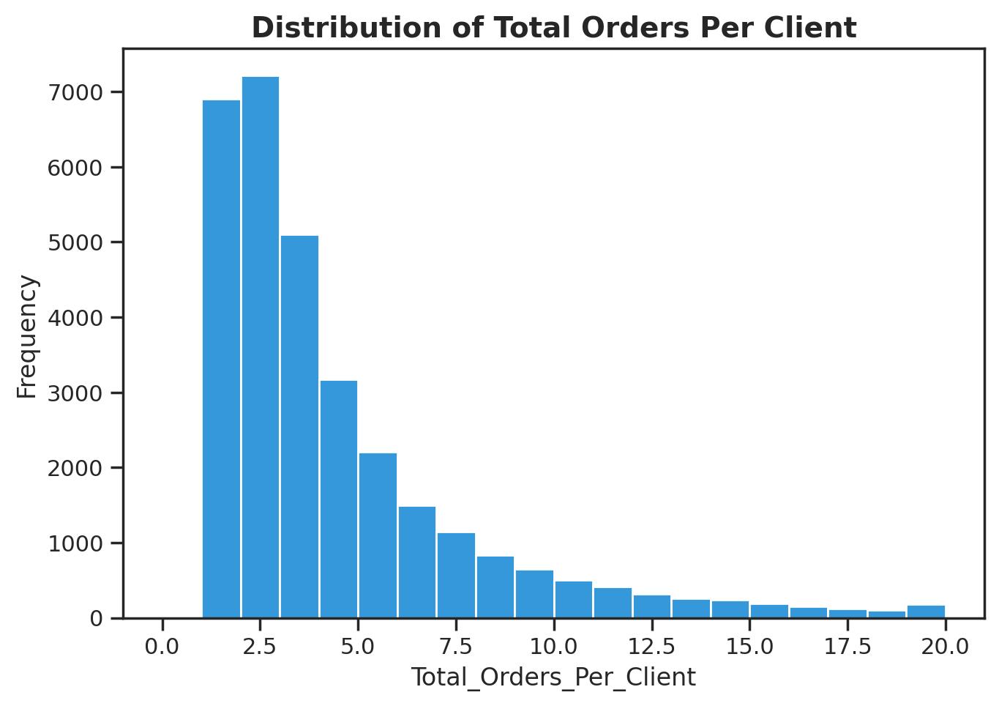

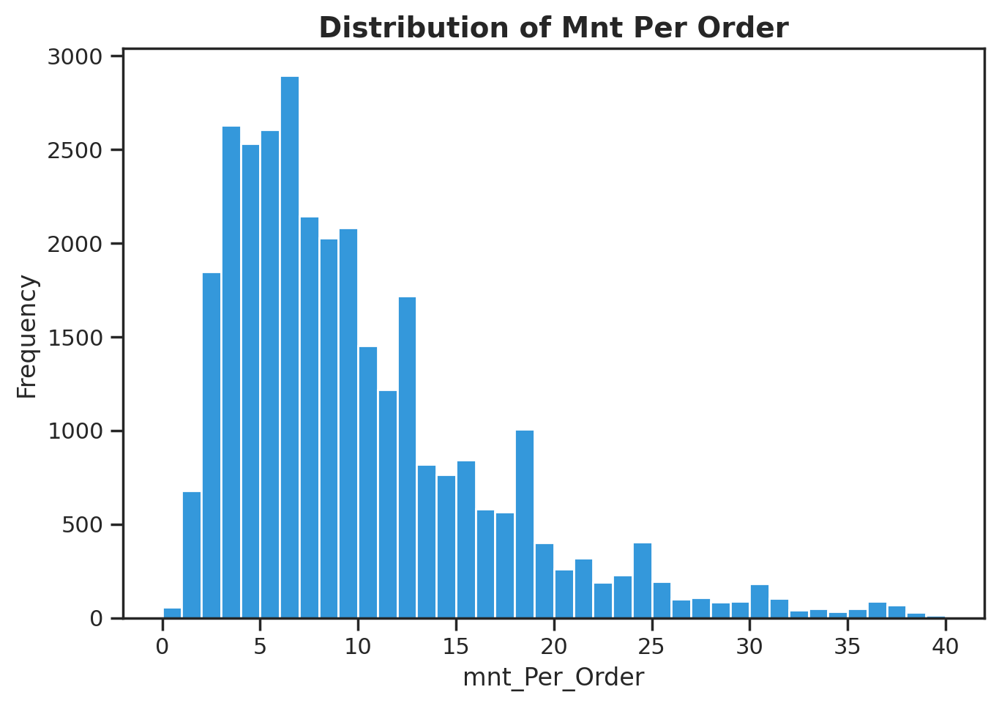

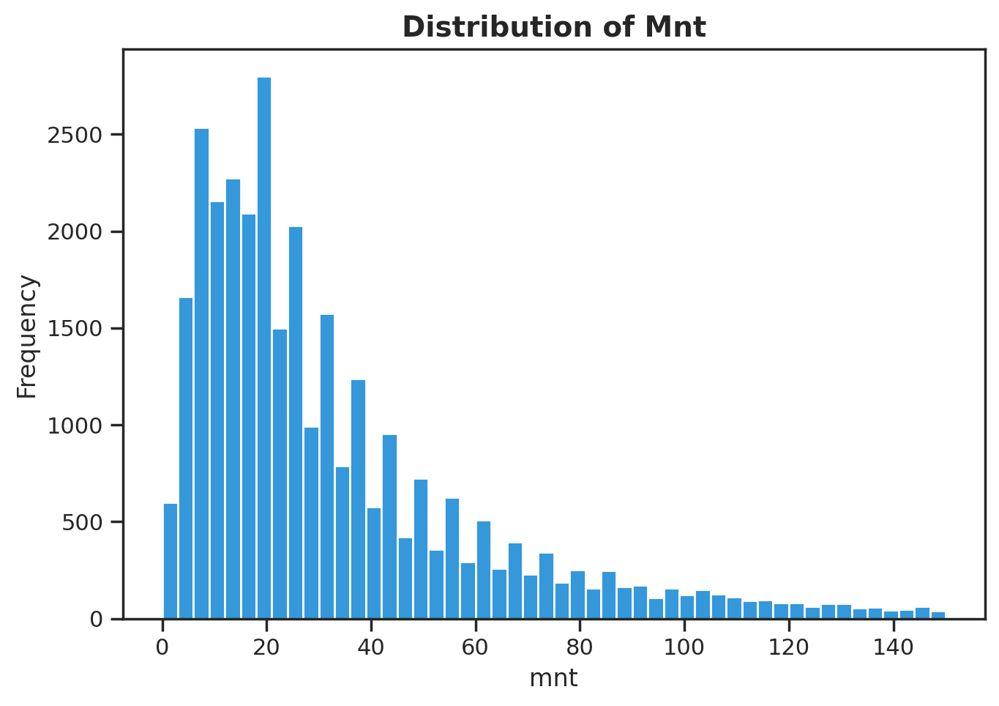

In [66]:
# Define the variables and their configurations
new_variables = ['Loyalty', 'CUI_diversity', 'activity', 'rcn', 'frq', 'Items_Per_Order', 'Total_Orders_Per_Client', 'mnt_Per_Order', 'mnt']

bin_config = {
    'Loyalty': 8,
    'CUI_diversity': 8,
    'activity': 50,
    'rcn': 50,
    'frq': 5,
    'Items_Per_Order': 10,
    'Total_Orders_Per_Client': 20,
    'mnt_Per_Order': 40,  # Added bin configuration for 'mnt_Per_Order'
    'mnt': 50  # Added bin configuration for 'mnt'
}

range_config = {
    'Loyalty': (0, df['Loyalty'].max()),
    'CUI_diversity': (0, 8),
    'activity': (0, df['activity'].max()),
    'rcn': (0, df['rcn'].max()),
    'frq':(0, 2),
    'Items_Per_Order': (1, 3),
    'Total_Orders_Per_Client': (0, 20),
    'mnt_Per_Order': (0, 40),
    'mnt': (0, 150)
}

# Set the style for Seaborn plots
sns.set_style('ticks')
for var in new_variables:
    title = f'Distribution of {var.replace("_", " ").title()}'
    bins = bin_config.get(var,50)
    range_tuple = range_config.get(var, (df[var].min(), df[var].max()))
    create_histogram(df[var], title, var, 'Frequency', bins = bins, range=range_tuple, color='#3498DB')

#### Correlations

In [67]:
def analyze_customer_behavior(df):
    """
    Analyze customer behavior patterns including CLV scoring, time-based ordering patterns,
    and loyalty scoring.
    Time is divided into six 4-hour periods.

    Parameters:
    df (pandas.DataFrame): DataFrame containing customer behavior data with columns:
        - recency: days since last order
        - frq: frequency of orders
        - mnt: monetary value
        - customer_age: age of customer
        - vendor_count: number of unique vendors used
        - HR_0 through HR_23: order counts for each hour

    Returns:
    pandas.DataFrame: Original dataframe with additional analysis columns
    """
    import pandas as pd

    # Calculate orders for each time period
    for period, hours in time_periods.items():
        df[f'Orders_{period}'] = df[hours].sum(axis=1)

    # Add peak ordering time
    order_cols = [f'Orders_{period}' for period in time_periods.keys()]
    df['Peak_Time'] = df[order_cols].idxmax(axis=1).str.replace('Orders_', '')

    return df

# Example usage:

df = analyze_customer_behavior(df)
result = df[[
    'CLV_Score',
    'Loyalty',
    'Age_Group',
    'Orders_Night',     # 12-4am
    'Orders_Dawn',      # 4-8am
    'Orders_Morning',   # 8am-12pm
    'Orders_Afternoon', # 12-4pm
    'Orders_Evening',   # 4-8pm
    'Orders_Dusk',      # 8pm-12am
    'Peak_Time'
]].head(5)

result


,CLV_Score,Loyalty,Age_Group,Orders_Night,Orders_Dawn,Orders_Morning,Orders_Afternoon,Orders_Evening,Orders_Dusk,Peak_Time
0,0.092846,0.0,18-24,0,0,0,0,2,0,Evening
1,0.090596,0.0,<18,0,0,2,0,0,0,Morning
2,0.088267,0.5,35-44,0,0,2,0,0,0,Morning
3,0.066010,0.0,25-34,0,0,1,1,0,0,Morning
4,0.071566,0.0,18-24,0,0,2,0,0,0,Morning


In [68]:
result.describe()

,CLV_Score,Loyalty,Orders_Night,Orders_Dawn,Orders_Morning,Orders_Afternoon,Orders_Evening,Orders_Dusk
count,5.000000,5.000000,5.0,5.0,5.000000,5.000000,5.000000,5.0
mean,0.081857,0.100000,0.0,0.0,1.400000,0.200000,0.400000,0.0
std,0.012199,0.223607,0.0,0.0,0.894427,0.447214,0.894427,0.0
min,0.066010,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0
25%,0.071566,0.000000,0.0,0.0,1.000000,0.000000,0.000000,0.0
50%,0.088267,0.000000,0.0,0.0,2.000000,0.000000,0.000000,0.0
75%,0.090596,0.000000,0.0,0.0,2.000000,0.000000,0.000000,0.0
max,0.092846,0.500000,0.0,0.0,2.000000,1.000000,2.000000,0.0


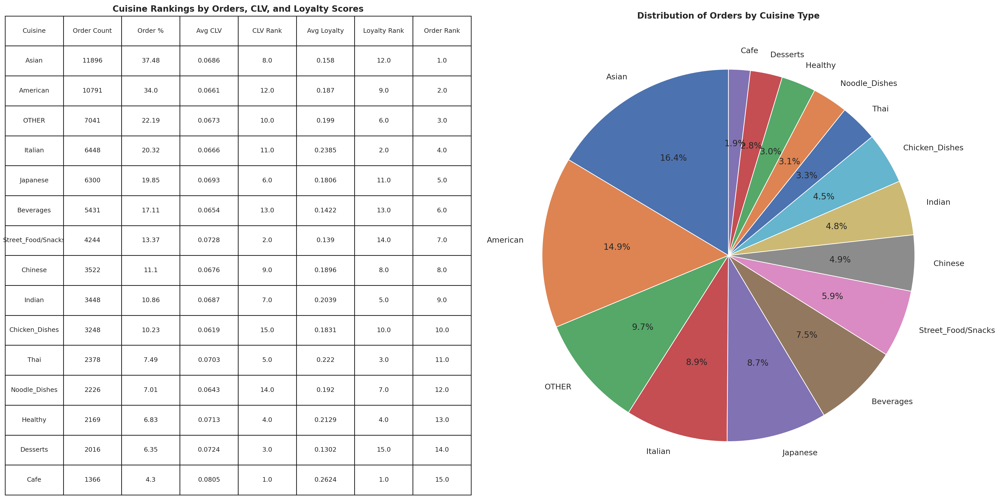


Correlations between metrics:
             Order %  Avg CLV  Avg Loyalty
Order %       1.0000  -0.3308      -0.2392
Avg CLV      -0.3308   1.0000       0.2751
Avg Loyalty  -0.2392   0.2751       1.0000

Detailed Rankings:
           Cuisine  Order Count  Order %  Avg CLV  CLV Rank  Avg Loyalty  Loyalty Rank  Order Rank
             Asian        11896    37.48   0.0686       8.0       0.1580          12.0         1.0
          American        10791    34.00   0.0661      12.0       0.1870           9.0         2.0
             OTHER         7041    22.19   0.0673      10.0       0.1990           6.0         3.0
           Italian         6448    20.32   0.0666      11.0       0.2385           2.0         4.0
          Japanese         6300    19.85   0.0693       6.0       0.1806          11.0         5.0
         Beverages         5431    17.11   0.0654      13.0       0.1422          13.0         6.0
Street_Food/Snacks         4244    13.37   0.0728       2.0       0.1390          14

In [69]:
def analyze_cuisine_performance(df):
    """
    Analyze and visualize CLV, Loyalty scores, and order distribution across different cuisines.
    """
    # Calculate total orders across all cuisines
    total_orders = df['Total_Orders_Per_Client'].sum()

    # Initialize lists to store results
    results = []

    # Calculate metrics for each cuisine
    for cuisine in cuisines.columns:
        # Filter for orders that include this cuisine
        cuisine_orders = df[df[cuisine] > 0]

        if len(cuisine_orders) > 0:
            avg_clv = cuisine_orders['CLV_Score'].mean()
            avg_loyalty = cuisine_orders['Loyalty'].mean()
            order_count = len(cuisine_orders)
            order_percentage = (order_count / len(df)) * 100

            results.append({
                'Cuisine': cuisine.replace('CUI_', ''),
                'Order Count': order_count,
                'Order %': order_percentage,
                'Avg CLV': avg_clv,
                'CLV Rank': 0,  # Will be filled later
                'Avg Loyalty': avg_loyalty,
                'Loyalty Rank': 0,  # Will be filled later
            })

    # Convert to DataFrame
    rankings_df = pd.DataFrame(results)

    # Add rankings
    rankings_df['CLV Rank'] = rankings_df['Avg CLV'].rank(ascending=False)
    rankings_df['Loyalty Rank'] = rankings_df['Avg Loyalty'].rank(ascending=False)
    rankings_df['Order Rank'] = rankings_df['Order %'].rank(ascending=False)

    # Sort by Order Percentage
    rankings_df = rankings_df.sort_values('Order %', ascending=False)

    # Round numerical columns
    rankings_df['Avg CLV'] = rankings_df['Avg CLV'].round(4)
    rankings_df['Avg Loyalty'] = rankings_df['Avg Loyalty'].round(4)
    rankings_df['Order %'] = rankings_df['Order %'].round(2)

    # Create visualization
    fig = plt.figure(figsize=(20, 10))

    # Create main rankings table
    ax1 = plt.subplot(1, 2, 1)
    table = plt.table(cellText=rankings_df.values,
                     colLabels=rankings_df.columns,
                     cellLoc='center',
                     loc='center',
                     bbox=[0, 0, 1, 1])

    # Adjust table appearance
    table.auto_set_font_size(False)
    table.set_fontsize(9)
    for cell in table._cells:
        table._cells[cell].set_height(0.08)

    plt.axis('off')
    plt.title('Cuisine Rankings by Orders, CLV, and Loyalty Scores', fontweight='bold')
    rankings_df.to_excel('cuisine_ranking.xlsx', index=False)

    # Create order distribution pie chart
    ax2 = plt.subplot(1, 2, 2)
    plt.pie(rankings_df['Order %'],
            labels=rankings_df['Cuisine'],
            autopct='%1.1f%%',
            startangle=90)
    plt.title('Distribution of Orders by Cuisine Type', fontweight='bold')

    # Adjust layout
    plt.tight_layout()

    # Display the plot
    plt.show()

    # Create correlation analysis between metrics
    correlation_metrics = ['Order %', 'Avg CLV', 'Avg Loyalty']
    correlations = rankings_df[correlation_metrics].corr()

    print("\nCorrelations between metrics:")
    print(correlations.round(4))

    print("\nDetailed Rankings:")
    print(rankings_df.to_string(index=False))

    return rankings_df

# Run the analysis
rankings = analyze_cuisine_performance(df)

In [70]:
def analyze_rfm_by_dimension(df, dimension):
    """
    Analyze RFM metrics grouped by a specific dimension
    """
    analysis = df.groupby(dimension).agg({
        'rcn': 'mean',
        'frq': 'mean',
        'mnt': ['mean', 'sum'],
        'Customer_Segment': lambda x: x.value_counts().head(1).index[0]
    }).round(2)

    analysis.columns = ['Avg_Recency', 'Avg_Frequency', 'Avg_Monetary', 'Total_Monetary', 'Dominant_Segment']
    return analysis

def analyze_cuisine_preferences(df):
    """
    Analyze RFM metrics by cuisine preferences
    """
    # Get all cuisine columns
    cuisine_cols = [col for col in df.columns if col.startswith('CUI_')]

    # Calculate total spend per cuisine
    cuisine_spend = pd.DataFrame()

    for col in cuisine_cols:
        cuisine_name = col.replace('CUI_', '')
        mask = df[col] > 0

        metrics = {
            'Total_Spend': df[mask][col].sum(),
            'Customer_Count': mask.sum(),
            'Avg_Order_Value': df[mask][col].mean(),
            'Avg_Customer_Recency': df[mask]['rcn'].mean(),
            'Avg_Customer_Frequency': df[mask]['frq'].mean(),
            'Most_Common_Segment': df[mask]['Customer_Segment'].mode().iloc[0] if mask.sum() > 0 else 'N/A'
        }

        cuisine_spend = pd.concat([cuisine_spend, pd.DataFrame([metrics], index=[cuisine_name])])

    return cuisine_spend.sort_values('Total_Spend', ascending=False).round(2)

def print_rfm_analysis(df):
    """
    Print comprehensive RFM analysis tables
    """
    # Calculate RFM scores first
    rfm_df = calculate_rfm_scores(df)

    print("1. RFM Analysis by Age Group:")
    print("-" * 100)
    age_analysis = analyze_rfm_by_dimension(rfm_df, 'Age_Group')
    print(age_analysis)
    print("\n")

    print("2. RFM Analysis by Region:")
    print("-" * 100)
    region_analysis = analyze_rfm_by_dimension(rfm_df, 'customer_region')
    print(region_analysis)
    print("\n")

    print("3. Cuisine Preference Analysis:")
    print("-" * 100)
    cuisine_analysis = analyze_cuisine_preferences(rfm_df)
    print(cuisine_analysis)
    print("\n")

    print("4. Overall Segment Distribution:")
    print("-" * 100)
    segment_dist = rfm_df['Customer_Segment'].value_counts()
    segment_pct = rfm_df['Customer_Segment'].value_counts(normalize=True).round(3) * 100
    print(pd.DataFrame({
        'Count': segment_dist,
        'Percentage': segment_pct
    }))

def calculate_rfm_scores(df):
    """
    Calculate RFM scores and segments for customer analysis
    """
    rfm_df = df.copy()

    # Calculate quartiles for R, F, M scores
    r_quartiles = pd.qcut(rfm_df['rcn'], q=4, labels=['4', '3', '2', '1'])
    f_quartiles = pd.qcut(rfm_df['frq'], q=4, labels=['1', '2', '3', '4'])
    m_quartiles = pd.qcut(rfm_df['mnt'], q=4, labels=['1', '2', '3', '4'])

    # Assign scores
    rfm_df['R_Score'] = r_quartiles.astype(str)
    rfm_df['F_Score'] = f_quartiles.astype(str)
    rfm_df['M_Score'] = m_quartiles.astype(str)

    # Calculate RFM Score (weighted average)
    rfm_df['RFM_Score'] = (
        0.35 * rfm_df['R_Score'].astype(int) +
        0.35 * rfm_df['F_Score'].astype(int) +
        0.30 * rfm_df['M_Score'].astype(int)
    )

    # Define customer segments
    def segment_customers(score):
        if score >= 3.5:
            return 'Best Customers'
        elif score >= 3:
            return 'Loyal Customers'
        elif score >= 2.5:
            return 'Average Customers'
        elif score >= 2:
            return 'Below Average Customers'
        else:
            return 'Lost Customers'

    rfm_df['Customer_Segment'] = rfm_df['RFM_Score'].apply(segment_customers)

    return rfm_df

# Example usage
print_rfm_analysis(df)

1. RFM Analysis by Age Group:
----------------------------------------------------------------------------------------------------
           Avg_Recency  Avg_Frequency  Avg_Monetary  Total_Monetary  \
Age_Group                                                             
<18              28.24           0.40         34.72        12602.70   
18-24            27.23           0.36         38.07       456954.60   
25-34            26.77           0.35         38.79       581607.18   
35-44            26.73           0.36         38.84       134243.29   
45-54            26.46           0.36         37.61        27640.90   
55+              25.38           0.34         41.03         7631.77   

                  Dominant_Segment  
Age_Group                           
<18        Below Average Customers  
18-24      Below Average Customers  
25-34      Below Average Customers  
35-44      Below Average Customers  
45-54      Below Average Customers  
55+        Below Average Customers  


2.

In [71]:
numeric_df = df.select_dtypes(include=[np.number])
correlation_matrix = numeric_df.corr()
columns_to_exclude = ['HR_0', 'HR_1', 'HR_2', 'HR_3',
                      'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11',
                      'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19',
                      'HR_20', 'HR_21', 'HR_22', 'HR_23', "DOW_0","DOW_1","DOW_2","DOW_3","DOW_4","DOW_5","DOW_6"]
correlation_matrix = correlation_matrix.drop(columns_to_exclude, axis=1)
correlation_matrix = correlation_matrix.drop(columns_to_exclude, axis=0)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
correlation_matrix.round(2)

correlation_matrix.to_csv('correlation_matrix.csv', index=True)

correlation_matrix = pd.read_csv('correlation_matrix.csv', index_col=0)

columns_to_display = [
    'Total_Orders_Per_Client',
    'product_count',
    'is_chain',
    'vendor_count',
    'activity',
    'Loyalty'
]


filtered_matrix = correlation_matrix.loc[columns_to_display, ['Total_Orders_Per_Client']]

filtered_matrix

,Total_Orders_Per_Client
Total_Orders_Per_Client,1.000000
product_count,0.964990
is_chain,0.866973
vendor_count,0.842243
activity,0.593832
Loyalty,0.481048


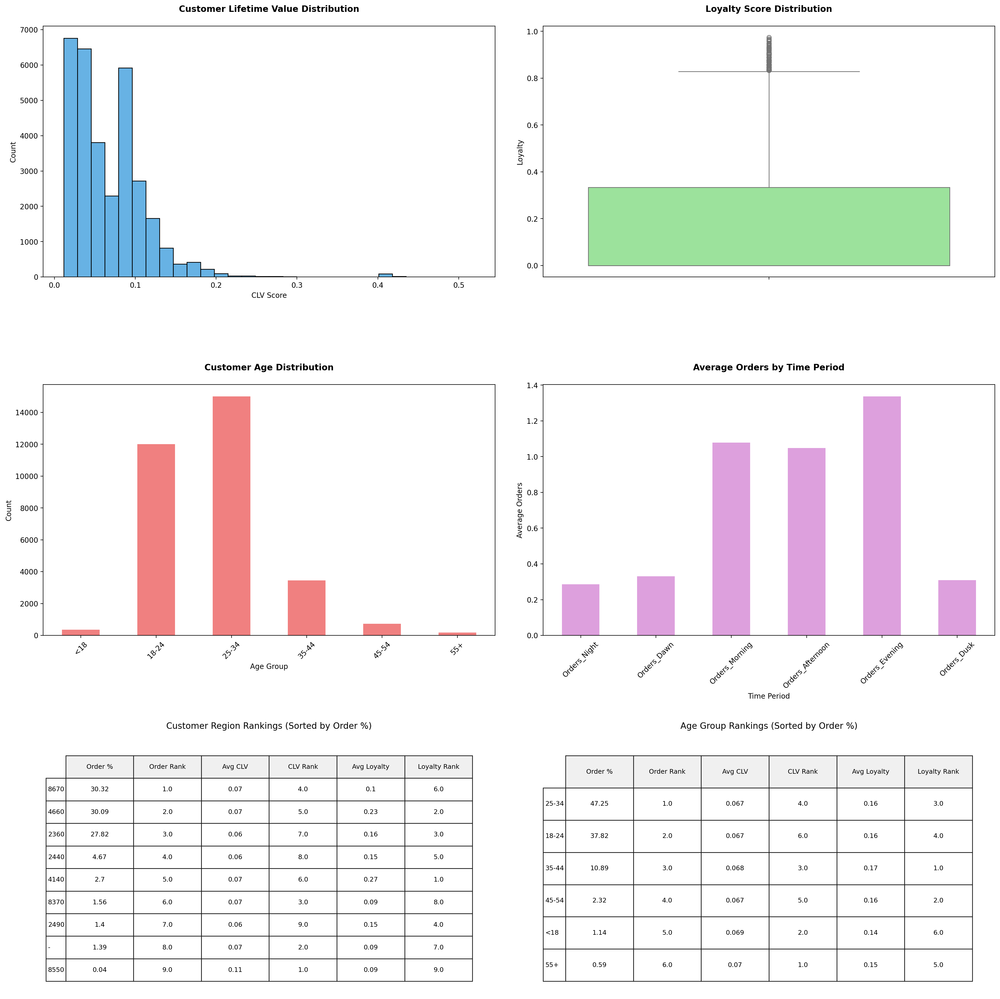


Detailed Rankings by Customer Region (sorted by Order %):
                 Order %  Order Rank  Avg CLV  CLV Rank  Avg Loyalty  Loyalty Rank
customer_region                                                                   
8670               30.32         1.0     0.07       4.0         0.10           6.0
4660               30.09         2.0     0.07       5.0         0.23           2.0
2360               27.82         3.0     0.06       7.0         0.16           3.0
2440                4.67         4.0     0.06       8.0         0.15           5.0
4140                2.70         5.0     0.07       6.0         0.27           1.0
8370                1.56         6.0     0.07       3.0         0.09           8.0
2490                1.40         7.0     0.06       9.0         0.15           4.0
-                   1.39         8.0     0.07       2.0         0.09           7.0
8550                0.04         9.0     0.11       1.0         0.09           9.0

Detailed Rankings by Age Gr

In [72]:
def visualize_customer_behavior(df):

    # Verify data is not empty
    if df.empty:
        raise ValueError("DataFrame is empty")

    # Check for null values in key columns
    key_columns = ['customer_region', 'CLV_Score', 'Loyalty', 'Age_Group', 'Peak_Time']
    null_counts = df[key_columns].isnull().sum()

    # Handle null values
    df_clean = df.copy()
    if null_counts['Loyalty'] > 0:
        print(f"Filling {null_counts['Loyalty']} null Loyalty_Score values with median")
        df_clean['Loyalty'].fillna(df_clean['Loyalty'].median(), inplace=True)

    if null_counts.any():
        print("Null values found in the following columns:")
        print(null_counts[null_counts > 0])

    # Create a figure with subplots
    plt.style.use('default')  # Use default style instead of seaborn
    fig = plt.figure(figsize=(20, 20))

    # 1. CLV Score Distribution
    plt.subplot(3, 2, 1)
    sns.histplot(data=df_clean, x='CLV_Score', bins=30, color='#3498DB')
    plt.title('Customer Lifetime Value Distribution', pad=20, fontsize=12, fontweight='bold')
    plt.xlabel('CLV Score')
    plt.ylabel('Count')

    # 2. Loyalty Score Distribution
    plt.subplot(3, 2, 2)
    sns.boxplot(data=df_clean, y='Loyalty', color='lightgreen')
    plt.title('Loyalty Score Distribution', pad=20, fontsize=12, fontweight='bold')

    # 3. Age Group Distribution
    plt.subplot(3, 2, 3)
    age_counts = df_clean['Age_Group'].value_counts().sort_index()
    age_counts.plot(kind='bar', color='lightcoral')
    plt.title('Customer Age Distribution', pad=20, fontsize=12, fontweight='bold')
    plt.xlabel('Age Group')
    plt.ylabel('Count')
    plt.xticks(rotation=45)

    # 4. Time Period Order Distribution
    plt.subplot(3, 2, 4)
    time_cols = ['Orders_Night', 'Orders_Dawn', 'Orders_Morning',
                 'Orders_Afternoon', 'Orders_Evening', 'Orders_Dusk']

    # Check if time columns exist
    available_time_cols = [col for col in time_cols if col in df_clean.columns]
    if available_time_cols:
        time_data = df_clean[available_time_cols].mean()
        time_data.plot(kind='bar', color='plum')
        plt.title('Average Orders by Time Period', pad=20, fontsize=12, fontweight='bold')
        plt.xlabel('Time Period')
        plt.ylabel('Average Orders')
        plt.xticks(rotation=45)
    else:
        plt.text(0.5, 0.5, 'Time period data not available',
                horizontalalignment='center', verticalalignment='center')

    # 5. Customer Region Rankings
    plt.subplot(3, 2, 5)

    # Calculate metrics by customer_region
    region_stats = df_clean.groupby('customer_region').agg({
        'CLV_Score': 'mean',
        'Loyalty': 'mean',
        'customer_region': 'count'
    }).rename(columns={'customer_region': 'Count'})

    total_customers = len(df_clean)
    region_rankings = pd.DataFrame({
        'Order %': (region_stats['Count'] / total_customers * 100).round(2),
        'Order Rank': (region_stats['Count'] / total_customers * 100).rank(ascending=False),
        'Avg CLV': region_stats['CLV_Score'].round(2),
        'CLV Rank': region_stats['CLV_Score'].rank(ascending=False),
        'Avg Loyalty': region_stats['Loyalty'].round(2),
        'Loyalty Rank': region_stats['Loyalty'].rank(ascending=False)
    })

    region_rankings = region_rankings.sort_values('Order %', ascending=False)

    # Create table for region rankings with improved formatting
    table_region = plt.table(cellText=region_rankings.values,
                           rowLabels=region_rankings.index,
                           colLabels=region_rankings.columns,
                           cellLoc='center',
                           loc='center',
                           bbox=[0.05, 0.05, 0.9, 0.9])  # Adjusted bbox for better spacing

    table_region.auto_set_font_size(False)
    table_region.set_fontsize(9)
    for cell in table_region._cells:
        table_region._cells[cell].set_height(0.1)
        if cell[0] == 0:  # Header row
            table_region._cells[cell].set_facecolor('#f0f0f0')
        # Create a DataFrame from the table

    plt.axis('off')
    plt.title('Customer Region Rankings (Sorted by Order %)', pad=20, fontsize=12)

    # 6. Age Group Rankings
    plt.subplot(3, 2, 6)

    # Calculate metrics by Age_Group
    age_stats = df_clean.groupby('Age_Group').agg({
        'CLV_Score': 'mean',
        'Loyalty': 'mean',
        'Age_Group': 'count'
    }).rename(columns={'Age_Group': 'Count'})

    age_rankings = pd.DataFrame({
        'Order %': (age_stats['Count'] / total_customers * 100).round(2),
        'Order Rank': (age_stats['Count'] / total_customers * 100).rank(ascending=False),
        'Avg CLV': age_stats['CLV_Score'].round(3),
        'CLV Rank': age_stats['CLV_Score'].rank(ascending=False),
        'Avg Loyalty': age_stats['Loyalty'].round(2),
        'Loyalty Rank': age_stats['Loyalty'].rank(ascending=False)
    })

    age_rankings = age_rankings.sort_values('Order %', ascending=False)

    # Create table for age rankings with improved formatting
    table_age = plt.table(cellText=age_rankings.values,
                         rowLabels=age_rankings.index,
                         colLabels=age_rankings.columns,
                         cellLoc='center',
                         loc='center',
                         bbox=[0.05, 0.05, 0.9, 0.9])  # Adjusted bbox for better spacing

    table_age.auto_set_font_size(False)
    table_age.set_fontsize(9)
    for cell in table_age._cells:
        table_age._cells[cell].set_height(0.1)
        if cell[0] == 0:  # Header row
            table_age._cells[cell].set_facecolor('#f0f0f0')

    plt.axis('off')
    plt.title('Age Group Rankings (Sorted by Order %)', pad=20, fontsize=12)

    # Adjust layout to prevent overlap
    plt.tight_layout(pad=3.0)  # Increased padding

    # Display the plot
    plt.show()

    print("\nDetailed Rankings by Customer Region (sorted by Order %):")
    print(region_rankings.to_string())
    print("\nDetailed Rankings by Age Group (sorted by Order %):")
    print(age_rankings.to_string())

    # Save to Excel files
    region_rankings.to_excel('region_rankings.xlsx', index=True)
    age_rankings.to_excel('age_group_rankings.xlsx', index=True)

    return region_rankings, age_rankings

region_rankings, age_rankings = visualize_customer_behavior(df)


=== Feature Statistics ===
                 Feature  Count  Percentage
0           is_prime_age  27976       88.15
6          prefers_chain  25701       80.98
4  is_peak_hour_customer  21198       66.79
1        is_prime_region  19173       60.41
2         is_high_active  15380       48.46
3   high_cuisine_variety   9757       30.74
7      is_loyal_customer   4992       15.73
5       has_high_variety   3101        9.77

=== Distribution of Total Positive Features ===
total_positive_features
0      32
1     605
2    3831
3    8611
4    8107
5    4972
6    3650
7    1442
8     487
Name: count, dtype: int64

=== Top 10 Customers by Features ===
     customer_id  is_prime_age  is_prime_region  is_high_active  \
2408  8c9f6827e2          True             True            True   
1045  f8cd91b2dc          True             True            True   
5915  74490ee3ec          True             True            True   
1864  2d2a82e81d          True             True            True   
7973  c590e195

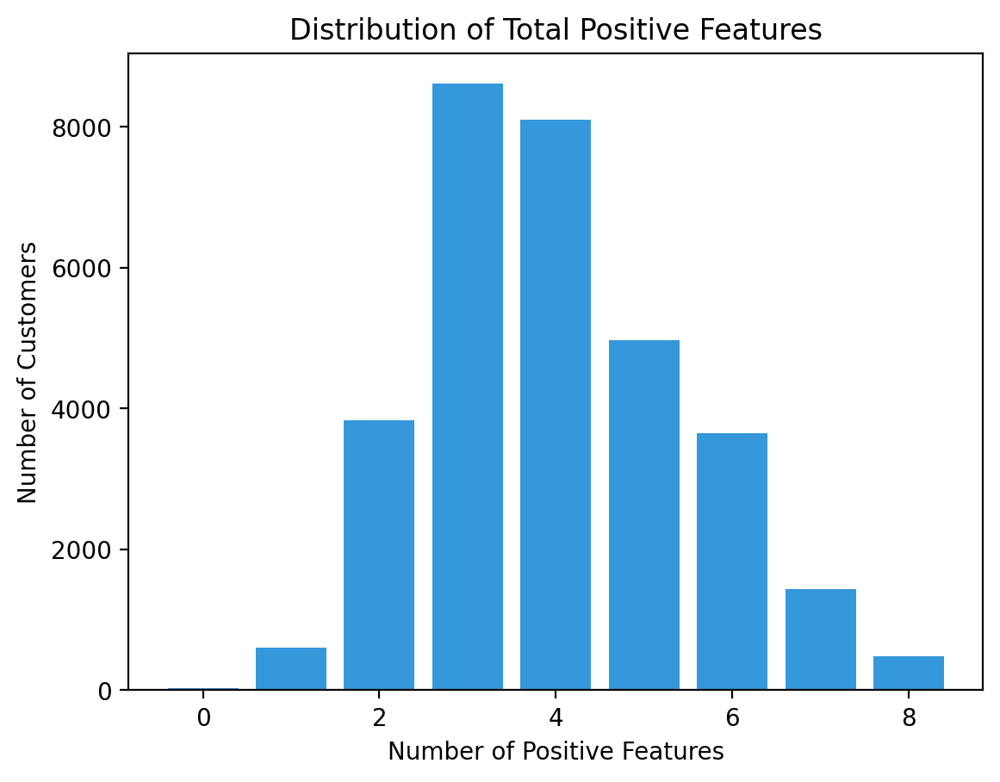


=== Key Feature Combinations ===

Loyalty & Chain Preference Cross-tab:
prefers_chain      False   True    All
is_loyal_customer                     
False               4674  22071  26745
True                1362   3630   4992
All                 6036  25701  31737

Cuisine Variety & Active Period Cross-tab:
is_high_active        False   True    All
high_cuisine_variety                     
False                 14431   7549  21980
True                   1926   7831   9757
All                   16357  15380  31737


In [73]:
# First, read the original CSV to get customer_id
original_df = pd.read_csv('DM2425_ABCDEats_DATASET.csv')
customer_id_df = original_df[['customer_id']]

def create_and_rank_binary_features(df, customer_ids):
    """
    Create binary features and rank customers based on feature counts
    Including customer_id from original data and new metrics
    """
    # Create binary features
    df_new = df.copy()

    # Add customer_id back
    df_new = df_new.reset_index()
    df_new['customer_id'] = customer_ids['customer_id']

    # 1. Prime Age Range (20-40 years)
    df_new['is_prime_age'] = (df_new['customer_age'] >= 20) & (df_new['customer_age'] <= 40)

    # 2. Prime Regions
    prime_regions = ['8670', '4660', '260']
    df_new['is_prime_region'] = df_new['customer_region'].isin(prime_regions)

    # 3. High Active Period
    df_new['is_high_active'] = df_new['activity'] > df_new['activity'].mean()

    # 4. Aggregated Cuisine Preferences
    # Combine all cuisine columns
    cuisine_cols = [col for col in df_new.columns if col.startswith('CUI_')]
    cuisine_threshold = df_new[cuisine_cols].sum(axis=1).mean()
    df_new['high_cuisine_variety'] = df_new[cuisine_cols].sum(axis=1) > cuisine_threshold

    # 5. Peak Hour Ordering
    peak_hours = [f'HR_{i}' for i in range(9, 19)]
    non_peak_hours = [f'HR_{i}' for i in list(range(0, 9)) + list(range(19, 24))]
    peak_hour_orders = df_new[peak_hours].sum(axis=1)
    non_peak_orders = df_new[non_peak_hours].sum(axis=1)
    df_new['is_peak_hour_customer'] = peak_hour_orders > non_peak_orders

    # 6. High Product Variety
    product_mean = df_new['product_count'].mean()
    product_std = df_new['product_count'].std()
    df_new['has_high_variety'] = df_new['product_count'] > (product_mean + product_std)

    # 7. Chain Preference (New)
    df_new['prefers_chain'] = df_new['is_chain'] >= 1

    # 8. High Loyalty (New)
    df_new['is_loyal_customer'] = df_new['Loyalty'] >= 0.5

    # Select binary features
    binary_features = [
        'is_prime_age',
        'is_prime_region',
        'is_high_active',
        'high_cuisine_variety',
        'is_peak_hour_customer',
        'has_high_variety',
        'prefers_chain',
        'is_loyal_customer'
    ]

    # Calculate total positive features for each customer
    df_new['total_positive_features'] = df_new[binary_features].sum(axis=1)

    # Create ranking
    df_new['customer_rank'] = df_new['total_positive_features'].rank(method='dense', ascending=False)

    # Select and order columns for display
    display_columns = ['customer_id'] + binary_features + ['total_positive_features', 'customer_rank']
    df_ranked = df_new[display_columns].sort_values('total_positive_features', ascending=False)

    return df_ranked

# Execute the analysis
binary_df = create_and_rank_binary_features(df, customer_id_df)

# Print summary statistics
print("\n=== Feature Statistics ===")
binary_features = ['is_prime_age', 'is_prime_region', 'is_high_active',
                  'high_cuisine_variety', 'is_peak_hour_customer',
                  'has_high_variety', 'prefers_chain', 'is_loyal_customer']

stats_df = pd.DataFrame({
    'Feature': binary_features,
    'Count': [binary_df[feat].sum() for feat in binary_features],
    'Percentage': [(binary_df[feat].sum() / len(binary_df) * 100).round(2) for feat in binary_features]
})
print(stats_df.sort_values('Count', ascending=False))

print("\n=== Distribution of Total Positive Features ===")
dist_df = binary_df['total_positive_features'].value_counts().sort_index()
print(dist_df)

print("\n=== Top 10 Customers by Features ===")
print(binary_df.head(10))

print("\n=== Bottom 10 Customers by Features ===")
print(binary_df.tail(10))

# Print segment sizes
total_customers = len(binary_df)
print("\n=== Customer Segments ===")
for i in range(binary_df['total_positive_features'].max() + 1):
    count = len(binary_df[binary_df['total_positive_features'] == i])
    print(f"Customers with {i} positive features: {count} ({(count/total_customers*100):.2f}%)")

# Get the count of each number of positive features
feature_counts = binary_df['total_positive_features'].value_counts().sort_index()

plt.bar(feature_counts.index, feature_counts.values, color='#3498DB')
plt.xlabel('Number of Positive Features')
plt.ylabel('Number of Customers')
plt.title('Distribution of Total Positive Features')
plt.show()

# Feature combinations
print("\n=== Key Feature Combinations ===")
print("\nLoyalty & Chain Preference Cross-tab:")
print(pd.crosstab(binary_df['is_loyal_customer'], binary_df['prefers_chain'], margins=True))

print("\nCuisine Variety & Active Period Cross-tab:")
print(pd.crosstab(binary_df['high_cuisine_variety'], binary_df['is_high_active'], margins=True))


In [74]:
# The highest total orders (1,531) come from customers with 3 features

# Join the data and analyze orders by rank
dforiginal = pd.read_csv('DM2425_ABCDEats_DATASET.csv')

# Calculate Total_Orders_Week from DOW columns
dforiginal['Total_Orders_Week'] = dforiginal[[f'DOW_{i}' for i in range(7)]].sum(axis=1)

# Merge binary features with original data
merged_df = binary_df.merge(dforiginal[['customer_id', 'Total_Orders_Week']],
                           on='customer_id',
                           how='left')

# Group by total positive features and analyze orders
rank_analysis = merged_df.groupby('total_positive_features').agg({
    'customer_id': 'count',  # Number of customers
    'Total_Orders_Week': ['mean', 'median', 'min', 'max', 'sum']  # Order statistics
}).round(2)

# Rename columns for clarity
rank_analysis.columns = ['Customer_Count', 'Avg_Orders', 'Median_Orders',
                        'Min_Orders', 'Max_Orders', 'Total_Orders']

# Add percentage of customers
rank_analysis['Customer_Percentage'] = (rank_analysis['Customer_Count'] /
                                      rank_analysis['Customer_Count'].sum() * 100).round(2)

# Add percentage of orders
rank_analysis['Orders_Percentage'] = (rank_analysis['Total_Orders'] /
                                    rank_analysis['Total_Orders'].sum() * 100).round(2)

# Sort by index (total_positive_features)
rank_analysis = rank_analysis.sort_index()

print("\n=== Order Analysis by Total Positive Features ===")
print(rank_analysis)

# Calculate correlations
correlation = merged_df['total_positive_features'].corr(merged_df['Total_Orders_Week'])
print(f"\nCorrelation between positive features and orders: {correlation:.3f}")

# Additional insights
print("\n=== Key Insights ===")
for features in range(len(rank_analysis)):
    customers = rank_analysis.loc[features, 'Customer_Count']
    orders = rank_analysis.loc[features, 'Total_Orders']
    print(f"\nCustomers with {features} positive features:")
    print(f"- Count: {customers:,.0f} ({rank_analysis.loc[features, 'Customer_Percentage']}%)")
    print(f"- Total Orders: {orders:,.0f} ({rank_analysis.loc[features, 'Orders_Percentage']}%)")
    print(f"- Average Orders: {rank_analysis.loc[features, 'Avg_Orders']:.1f}")

# Create cumulative analysis
rank_analysis['Cumulative_Customers'] = (rank_analysis['Customer_Percentage'].cumsum()).round(2)
rank_analysis['Cumulative_Orders'] = (rank_analysis['Orders_Percentage'].cumsum()).round(2)

print("\n=== Cumulative Analysis ===")
print(rank_analysis[['Customer_Percentage', 'Cumulative_Customers',
                     'Orders_Percentage', 'Cumulative_Orders']])

# Save the analysis results
rank_analysis.to_csv('rank_order_analysis.csv')


=== Order Analysis by Total Positive Features ===
                         Customer_Count  Avg_Orders  Median_Orders  \
total_positive_features                                              
0                                    32        2.41            2.0   
1                                   607        2.51            2.0   
2                                  3834        2.56            2.0   
3                                  8623        3.00            2.0   
4                                  8113        3.79            3.0   
5                                  4972        5.22            4.0   
6                                  3653        7.04            5.0   
7                                  1442        9.46            7.0   
8                                   487       12.22            9.0   

                         Min_Orders  Max_Orders  Total_Orders  \
total_positive_features                                         
0                                 1          10 

<hr>
<a class="anchor" id="preprocessing">
    
# 6. Pre-Processing
    
</a>

<hr>
<a class="anchor" id="noutliers">
    
## 6.1 Outliers

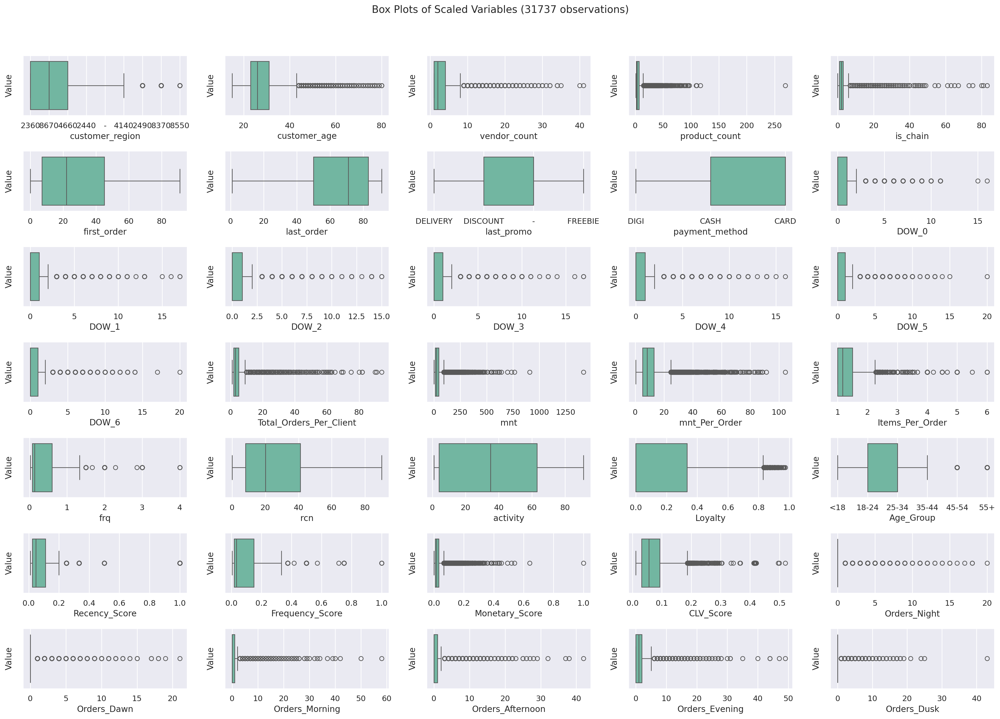

In [75]:
sns.set()

fig, axes = plt.subplots(7, 5, figsize=(20, 15))

columns_to_plot = [col for col in df.columns if 'CUI' not in col and 'HR' not in col]

for ax, feat in zip(axes.flatten(), columns_to_plot):
    sns.boxplot(x=df[feat], ax=ax, palette='Set2')
    ax.set_xlabel(feat)
    ax.set_ylabel('Value')

title = f"Box Plots of Scaled Variables ({df.shape[0]} observations)"
plt.suptitle(title)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [76]:
# Visualize CUI features
# sns.set()

# fig, axes = plt.subplots(4, 4, figsize=(20, 15))

# columns_to_plot = [col for col in df.columns if 'CUI' in col]

#for ax, feat in zip(axes.flatten(), columns_to_plot):
#    sns.boxplot(x=df[feat], ax=ax, palette='Set2')
#    ax.set_xlabel(feat)
#    ax.set_ylabel('Value')

#title = f"Box Plots of Scaled Variables ({df.shape[0]} observations)"
#plt.suptitle(title)
#plt.tight_layout(rect=[0, 0.03, 1, 0.95])
#plt.show()

 Note: It appears that many features have outliers on the upper end (beyond the upper whiskers of the boxplots)<br>
The upper whisker ends either at: <br>
1. The largest value within Q3+1.5*IQR, or <br>
2. The maximum value in the dataset if no values exceed this threshold. <br>
    
Based on this observation, we decided to categorize all the observations falling above that threshold to be outliers. <br>
We decided for winsorization instead of truncation to keep and treat the abnormal values. We assume these observations are real values and we don't want to remove them. <br>

The following features will be treated for outliers through winsorization
- `vendor_count`
- `product_count`
- `is_chain`
- `Total_Orders_Per_Client`
- `mnt`
- `mnt_Per_Order`
- `Items_Per_Order`
- `frq`
- `rcn`
- `activity`
- `CUI_diversity`
- `Loyalty`
- `Recency_Score`
- `Frequency_Score`
- `Monetary_Score`
- `CLV_Score`

We decided to bucket these features:
- `customer age` ---> `Age_Group`
- Cuisines
- DOWs
- HRs ---> `Peak_Time`

These variables will be transformed to binary (?) variables:
- `customer_region`
- `last_promo`
- `payment_method`

These features don't have any outliers:
- `first_order`
- `last_order`



In [77]:
features_to_win = ["vendor_count", "product_count", "is_chain", "Total_Orders_Per_Client", "mnt", "mnt_Per_Order",
                "Items_Per_Order", "frq", "rcn", "activity", "CUI_diversity", "Loyalty", "Recency_Score", "Frequency_Score",
                "Monetary_Score", "CLV_Score"]


In [78]:
# Modified Winsorization Function
def winsorize_upper(data):
    q1, q3 = np.percentile(data, [25, 75])
    iqr = q3 - q1
    # Compute the upper whisker
    upper_bound = q3 + (1.5 * iqr)
    # Apply trimming only above the upper whisker
    data[data > upper_bound] = upper_bound
    return np.where(data > upper_bound, upper_bound, data)  # Cap values above the upper bound

# Winsorization
def winsorize(data, p=0.01):
    q1, q3 = np.percentile(data, [25, 75])
    iqr = q3 - q1
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)
    data[data < lower_bound] = lower_bound
    data[data > upper_bound] = upper_bound
    return data

# Truncation
def truncate(data, p=0.95):
    threshold = np.percentile(data, p)
    data[data > threshold] = threshold
    return data

def treat_outliers(data):

    data = winsorize(data, p=0.01)

    #data = truncate(data, p=0.95)

    return data


In [79]:
# Apply winsorization
for col in features_to_win:
    df[col] = winsorize_upper(df[col].values)

df.describe()

,customer_age,vendor_count,product_count,is_chain,first_order,last_order,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken_Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle_Dishes,CUI_OTHER,CUI_Street_Food/Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,Total_Orders_Per_Client,mnt,mnt_Per_Order,Items_Per_Order,frq,rcn,activity,CUI_diversity,Loyalty,Recency_Score,Frequency_Score,Monetary_Score,CLV_Score,Orders_Night,Orders_Dawn,Orders_Morning,Orders_Afternoon,Orders_Evening,Orders_Dusk
count,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.00000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.00000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000
mean,27.497842,2.918581,4.932445,2.252891,28.608375,64.058985,4.898412,9.998594,2.308218,0.804975,0.771751,1.438027,0.888566,0.954724,1.638914,3.248795,3.009058,0.715062,3.014186,3.927394,0.845701,0.558339,0.570029,0.593503,0.622081,0.680814,0.655796,0.707471,0.048902,0.054069,0.063428,0.118820,0.102152,0.08227,0.069918,0.077008,0.132432,0.234962,0.331096,0.379904,0.315625,0.237452,0.216624,0.278319,0.358131,0.392759,0.338564,0.246747,0.143492,0.071494,0.048492,0.045373,3.686927,33.267142,9.844285,1.283130,0.347879,26.941015,36.45061,2.248039,0.161565,0.079498,0.086970,0.023455,0.066017,0.285219,0.331348,1.078394,1.048020,1.336201,0.308851
std,7.080691,2.035818,3.931106,1.952278,24.302594,22.939355,11.667887,23.603496,8.492919,6.442166,3.665578,8.210623,5.272012,5.844075,7.460068,11.272500,10.202599,4.546970,9.789314,15.579992,4.443200,1.015171,1.045785,1.047444,1.071099,1.089727,1.071256,1.169202,0.313652,0.317700,0.352228,0.498135,0.438448,0.35944,0.329990,0.378134,0.636923,0.726425,0.892982,0.961879,0.844199,0.638706,0.600230,0.739659,0.876181,0.945570,0.895771,0.796995,0.587839,0.349330,0.298955,0.282608,2.612549,26.736028,6.222479,0.350075,0.390181,22.939355,29.40898,1.350544,0.228829,0.072992,0.097545,0.018850,0.040343,0.907566,0.946374,2.093201,1.834232,2.336247,0.989525
min,15.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.370000,0.370000,1.000000,0.022222,0.000000,1.00000,1.000000,0.000000,0.010989,0.005556,0.000261,0.011496,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,1.000000,2.000000,1.000000,7.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0

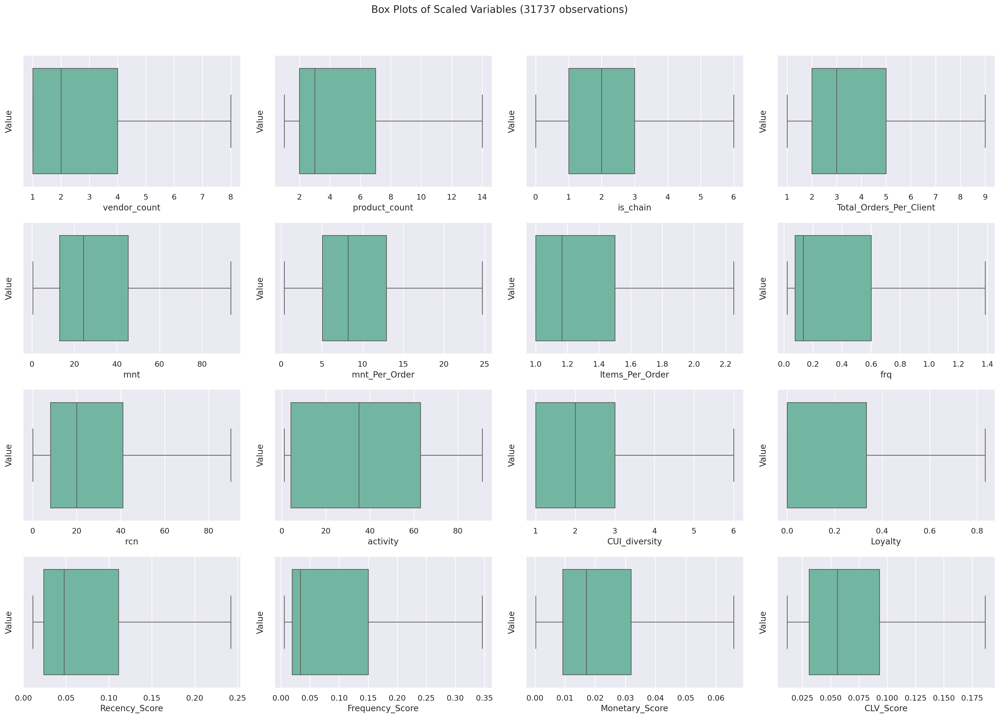

In [80]:
sns.set()

fig, axes = plt.subplots(4, 4, figsize=(20, 15))

columns_to_plot = features_to_win

for ax, feat in zip(axes.flatten(), columns_to_plot):
    sns.boxplot(x=df[feat], ax=ax, palette='Set2')
    ax.set_xlabel(feat)
    ax.set_ylabel('Value')

title = f"Box Plots of Scaled Variables ({df.shape[0]} observations)"
plt.suptitle(title)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [81]:
# need it not encoded and scaled in this way for dimension reductionality

numeric_df.to_csv('UMAP_df.csv')

<hr>
<a class="anchor" id="bucketing">
    
## 6.2 Bucketing

We decided to bucket these features:
- Cuisines ('CUI_American', 'CUI_Asian', create 'CUI_Other' - a new variable, which is made of all the other cuisines added together)
- DOWs ('Weekday_orders' and 'Weekend_orders')
- HRs --->  time periods   ---> `Peak_Time` ('Afternoon', 'Morning' etc.) (done)
- `customer age`  --->  `Age_Group` (6 buckets) (done)
- `customer_region` (Three biggest regions + other acumulating the rest)

Next, these variables will be transformed to binary (?) variables:
- `last_promo` (if promo used 1, if not 0)
- `payment_method` (if cash 0, if promo or digi 1)

In [82]:
# Create mapping dictionaries

# Transforming age buckets
age_group_mapping = {
    '<18': 0,
    '18-24': 1,
    '25-34': 2,
    '35-44': 3,
    '45-54': 4,
    '55+': 5
}

customer_region_mapping = {
    '2440': 0, '4140': 0, '2490': 0, '8370': 0, '8550': 0, '-': 0,  # Regions with lower customer counts (11.8%)
    '2360': 1,  # 27.8% of customers
    '4660': 2,  # 30.1% of customers
    '8670': 3   # 30.3% of customers
}

# Last promo will be transformed so that we know who used promo with their last order and who didnt
last_promo_mapping = {
    '-': 0,        # Using '-'
    'DELIVERY':1, 'DISCOUNT':2, 'FREEBIE': 3
}

# For payment method a binary variable will be created: 1 if CARD OR DIGI, 0 if CASH
payment_method_mapping = {
    'CASH': 0,
    'CARD': 1,
    'DIGI': 2
}

def encode_categories(df):
    """
    Encode categorical variables in the dataframe using the defined mappings
    and make changes directly to the input DataFrame.

    Changes are made directly to the input DataFrame.
    """
    # Define mappings for each column
    columns_to_encode = {
        'Age_Group': age_group_mapping,
        'customer_region': customer_region_mapping,
        'last_promo': last_promo_mapping,
        'payment_method': payment_method_mapping
    }

    # Apply mappings directly to the DataFrame
    for col, mapping in columns_to_encode.items():
        if col in df.columns:
            df[col] = df[col].map(mapping)

# Apply bucketing/encoding to df
encode_categories(df)

In [83]:
df.head()

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken_Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle_Dishes,CUI_OTHER,CUI_Street_Food/Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,Total_Orders_Per_Client,mnt,mnt_Per_Order,Items_Per_Order,frq,rcn,activity,CUI_diversity,Loyalty,Age_Group,Recency_Score,Frequency_Score,Monetary_Score,CLV_Score,Orders_Night,Orders_Dawn,Orders_Morning,Orders_Afternoon,Orders_Evening,Orders_Dusk,Peak_Time
0,1,18,2.0,5.0,1.0,0,1,1,2,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,2.0,28.88,14.440,2.25,1.000000,90.0,2.0,1.0,0.0,1,0.010989,0.250000,0.020362,0.092846,0,0,0,0,2,0,Evening
1,3,17,2.0,2.0,2.0,0,1,2,2,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,2.0,19.21,9.600,1.00,1.000000,90.0,2.0,2.0,0.0,0,0.010989,0.250000,0.013544,0.090596,0,0,2,0,0,0,Morning
2,2,38,1.0,2.0,2.0,0,1,2,0,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,2.0,9.20,4.600,1.00,1.000000,90.0,2.0,1.0,0.5,3,0.010989,0.250000,0.006487,0.088267,0,0,2,0,0,0,Morning
3,2,27,2.0,3.0,1.0,0,2,1,2,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,2.0,31.56,15.780,1.50,0.666667,89.0,3.0,2.0,0.0,2,0.011111,0.166667,0.022252,0.066010,0,0,1,1,0,0,Morning
4,2,20,2.0,5.0,0.0,0,2,0,2,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.0,55.44,24.695,2.25,0.666667,89.0,3.0,2.0,0.0,1,0.011111,0.166667,0.039088,0.071566,0,0,2,0,0,0,Morning


In [84]:
def calculate_rfm_score(df):
    # Calculate RFM Score
    df['RFM_Score'] = (
        df['Recency_Score'] * 0.35 +
        df['Frequency_Score'] * 0.35 +
        df['Monetary_Score'] * 0.30
    )

    # Drop individual score columns
    df = df.drop(['Recency_Score', 'Frequency_Score', 'Monetary_Score'], axis=1)

    return df

In [85]:
df.head()

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken_Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle_Dishes,CUI_OTHER,CUI_Street_Food/Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,Total_Orders_Per_Client,mnt,mnt_Per_Order,Items_Per_Order,frq,rcn,activity,CUI_diversity,Loyalty,Age_Group,Recency_Score,Frequency_Score,Monetary_Score,CLV_Score,Orders_Night,Orders_Dawn,Orders_Morning,Orders_Afternoon,Orders_Evening,Orders_Dusk,Peak_Time
0,1,18,2.0,5.0,1.0,0,1,1,2,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,2.0,28.88,14.440,2.25,1.000000,90.0,2.0,1.0,0.0,1,0.010989,0.250000,0.020362,0.092846,0,0,0,0,2,0,Evening
1,3,17,2.0,2.0,2.0,0,1,2,2,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,2.0,19.21,9.600,1.00,1.000000,90.0,2.0,2.0,0.0,0,0.010989,0.250000,0.013544,0.090596,0,0,2,0,0,0,Morning
2,2,38,1.0,2.0,2.0,0,1,2,0,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,2.0,9.20,4.600,1.00,1.000000,90.0,2.0,1.0,0.5,3,0.010989,0.250000,0.006487,0.088267,0,0,2,0,0,0,Morning
3,2,27,2.0,3.0,1.0,0,2,1,2,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,2.0,31.56,15.780,1.50,0.666667,89.0,3.0,2.0,0.0,2,0.011111,0.166667,0.022252,0.066010,0,0,1,1,0,0,Morning
4,2,20,2.0,5.0,0.0,0,2,0,2,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.0,55.44,24.695,2.25,0.666667,89.0,3.0,2.0,0.0,1,0.011111,0.166667,0.039088,0.071566,0,0,2,0,0,0,Morning


In [86]:
# Calculate RFM scores if they don't exist yet
if 'RFM_Score' not in df.columns:
    df = calculate_rfm_scores(df)  # Assuming you have the calculate_rfm_scores function

# Display the first 5 rows of the modified DataFrame
df.head(5)


,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken_Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle_Dishes,CUI_OTHER,CUI_Street_Food/Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,Total_Orders_Per_Client,mnt,mnt_Per_Order,Items_Per_Order,frq,rcn,activity,CUI_diversity,Loyalty,Age_Group,Recency_Score,Frequency_Score,Monetary_Score,CLV_Score,Orders_Night,Orders_Dawn,Orders_Morning,Orders_Afternoon,Orders_Evening,Orders_Dusk,Peak_Time,R_Score,F_Score,M_Score,RFM_Score,Customer_Segment
0,1,18,2.0,5.0,1.0,0,1,1,2,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,2.0,28.88,14.440,2.25,1.000000,90.0,2.0,1.0,0.0,1,0.010989,0.250000,0.020362,0.092846,0,0,0,0,2,0,Evening,1,4,3,2.65,Average Customers
1,3,17,2.0,2.0,2.0,0,1,2,2,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,2.0,19.21,9.600,1.00,1.000000,90.0,2.0,2.0,0.0,0,0.010989,0.250000,0.013544,0.090596,0,0,2,0,0,0,Morning,1,4,2,2.35,Below Average Customers
2,2,38,1.0,2.0,2.0,0,1,2,0,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,2.0,9.20,4.600,1.00,1.000000,90.0,2.0,1.0,0.5,3,0.010989,0.250000,0.006487,0.088267,0,0,2,0,0,0,Morning,1,4,1,2.05,Below Average Customers
3,2,27,2.0,3.0,1.0,0,2,1,2,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,2.0,31.56,15.780,1.50,0.666667,89.0,3.0,2.0,0.0,2,0.011111,0.166667,0.022252,0.066010,0,0,1,1,0,0,Morning,1,4,3,2.65,Average Customers
4,2,20,2.0,5.0,0.0,0,2,0,2,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.0,55.44,24.695,2.25,0.666667,89.0,3.0,2.0,0.0,1,0.011111,0.166667,0.039088,0.071566,0,0,2,0,0,0,Morning,1,4,4,2.95,Average Customers


In [87]:
columns_to_drop = ['customer_age', 'HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4',
                   'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11',
                   'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18',
                   'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23',  'Recency_Score',
                   'Frequency_Score', 'Monetary_Score', 'CUI_diversity', 'first_order',	'last_order', 'Peak_Time',
                   'Customer_Segment', 'R_Score',	'F_Score',	'M_Score']

# Filter out columns that don't exist
existing_columns_to_drop = [col for col in columns_to_drop if col in df.columns]

# Drop the existing columns
df.drop(columns=existing_columns_to_drop, inplace=True)

# Display remaining columns
df.head(5)

,customer_region,vendor_count,product_count,is_chain,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken_Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle_Dishes,CUI_OTHER,CUI_Street_Food/Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,Total_Orders_Per_Client,mnt,mnt_Per_Order,Items_Per_Order,frq,rcn,activity,Loyalty,Age_Group,CLV_Score,Orders_Night,Orders_Dawn,Orders_Morning,Orders_Afternoon,Orders_Evening,Orders_Dusk,RFM_Score
0,1,2.0,5.0,1.0,1,2,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,2.0,28.88,14.440,2.25,1.000000,90.0,2.0,0.0,1,0.092846,0,0,0,0,2,0,2.65
1,3,2.0,2.0,2.0,2,2,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,2.0,19.21,9.600,1.00,1.000000,90.0,2.0,0.0,0,0.090596,0,0,2,0,0,0,2.35
2,2,1.0,2.0,2.0,2,0,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,2.0,9.20,4.600,1.00,1.000000,90.0,2.0,0.5,3,0.088267,0,0,2,0,0,0,2.05
3,2,2.0,3.0,1.0,1,2,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,2.0,31.56,15.780,1.50,0.666667,89.0,3.0,0.0,2,0.066010,0,0,1,1,0,0,2.65
4,2,2.0,5.0,0.0,0,2,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,2.0,55.44,24.695,2.25,0.666667,89.0,3.0,0.0,1,0.071566,0,0,2,0,0,0,2.95


### Need to remove outliers in the transformed features

In [89]:
# Handle outliers in the transformed variables
new_features_to_win = ['RFM_Score']

# Apply winsorization
for col in new_features_to_win:
    df[col] = winsorize_upper(df[col].values)

In [ ]:
#sns.set()

#fig, axes = plt.subplots(3, 2, figsize=(20, 15))

#columns_to_plot = new_features_to_win

#for ax, feat in zip(axes.flatten(), columns_to_plot):
#    sns.boxplot(x=df[feat], ax=ax, palette='Set2')
#    ax.set_xlabel(feat)
#    ax.set_ylabel('Value')

#title = f"Box Plots of Scaled Variables ({df.shape[0]} observations)"
#plt.suptitle(title)
#plt.tight_layout(rect=[0, 0.03, 1, 0.95])
#plt.show()

In [ ]:
!

<hr>
<a class="anchor" id="encoding">
    
## 6.3 Encoding

Only need to encode `Peak_Time` and `customer_region` <br>
We decided to use one hot encoding since these values have low cardinalities and are not ordinal

In [93]:
columns_to_OneHotEncode = ['customer_region']

In [94]:
# One-Hot Encoding

# Create a new dataframe for the One-Hot Encoding
df_ohe = df.copy()

# Function to change the name of the columns
# Source: https://scikit-learn.org/dev/modules/generated/sklearn.preprocessing.OneHotEncoder.html
def custom_combiner(feature, category):
    return str(feature) + "_" + str(category)

# Initialize the OneHotEncoder
one_hot_encoder = OneHotEncoder(feature_name_combiner=custom_combiner,       # Custom function to change the name of the columns
                                handle_unknown="ignore",                     # Ignore unknown categories
                                sparse_output=False,                         # sparse=False to return a numpy array
                                drop=None)                                # drop='first' to fix the dummy variable trap (n-1)

# Fit the one_hot_encoder on the specified columns
one_hot_encoder.fit(pd.concat([df_ohe], axis=0)[columns_to_OneHotEncode])

# Transform the specified column
ohe_values = one_hot_encoder.transform(df_ohe[columns_to_OneHotEncode])
df_ohe_values = pd.DataFrame(ohe_values,
                            columns=one_hot_encoder.get_feature_names_out(columns_to_OneHotEncode),
                            index=df_ohe.index)
df_ohe = pd.concat([df_ohe.drop(columns=columns_to_OneHotEncode), df_ohe_values], axis=1)

df_ohe.head()

,vendor_count,product_count,is_chain,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken_Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle_Dishes,CUI_OTHER,CUI_Street_Food/Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,Total_Orders_Per_Client,mnt,mnt_Per_Order,Items_Per_Order,frq,rcn,activity,Loyalty,Age_Group,CLV_Score,Orders_Night,Orders_Dawn,Orders_Morning,Orders_Afternoon,Orders_Evening,Orders_Dusk,RFM_Score,customer_region_0,customer_region_1,customer_region_2,customer_region_3
0,2.0,5.0,1.0,1,2,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,2.0,28.88,14.440,2.25,1.000000,90.0,2.0,0.0,1,0.092846,0,0,0,0,2,0,2.65,0.0,1.0,0.0,0.0
1,2.0,2.0,2.0,2,2,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,2.0,19.21,9.600,1.00,1.000000,90.0,2.0,0.0,0,0.090596,0,0,2,0,0,0,2.35,0.0,0.0,0.0,1.0
2,1.0,2.0,2.0,2,0,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,2.0,9.20,4.600,1.00,1.000000,90.0,2.0,0.5,3,0.088267,0,0,2,0,0,0,2.05,0.0,0.0,1.0,0.0
3,2.0,3.0,1.0,1,2,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,2.0,31.56,15.780,1.50,0.666667,89.0,3.0,0.0,2,0.066010,0,0,1,1,0,0,2.65,0.0,0.0,1.0,0.0
4,2.0,5.0,0.0,0,2,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,2.0,55.44,24.695,2.25,0.666667,89.0,3.0,0.0,1,0.071566,0,0,2,0,0,0,2.95,0.0,0.0,1.0,0.0


In [97]:
df_ohe.describe(include = 'all')

,vendor_count,product_count,is_chain,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken_Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle_Dishes,CUI_OTHER,CUI_Street_Food/Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,Total_Orders_Per_Client,mnt,mnt_Per_Order,Items_Per_Order,frq,rcn,activity,Loyalty,Age_Group,CLV_Score,Orders_Night,Orders_Dawn,Orders_Morning,Orders_Afternoon,Orders_Evening,Orders_Dusk,RFM_Score,customer_region_0,customer_region_1,customer_region_2,customer_region_3
count,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.00000,31737.000000,31737.0,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14995.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,2.918581,4.932445,2.252891,0.888364,1.015187,4.898412,9.998594,2.308218,0.804975,0.771751,1.438027,0.888566,0.954724,1.638914,3.248795,3.009058,0.715062,3.014186,3.927394,0.845701,0.558339,0.570029,0.593503,0.622081,0.680814,0.655796,0.707471,3.686927,33.267142,9.844285,1.283130,0.347879,26.941015,36.45061,0.161565,NaN,0.066017,0.285219,0.331348,1.078394,1.048020,1.336201,0.308851,2.508433,0.117686,0.278193,0.300911,0.303211
std,2.035818,3.931106,1.952278,1.096110,0.605378,11.667887,23.603496,8.492919,6.442166,3.665578,8.210623,5.272012,5.844075,7.460068,11.272500,10.202599,4.546970,9.789314,15.579992,4.443200,1.015171,1.045785,1.047444,1.071099,1.089727,1.071256,1.169202,2.612549,26.736028,6.222479,0.350075,0.390181,22.939355,29.40898,0.228829,NaN,0.040343,0.907566,0.946374,2.093201,1.834232,2.336247,0.989525,0.606241,0.322241,0.448116,0.458661,0.459653
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.370000,0.370000,1.000000,0.022222,0.000000,1.00000,0.000000,NaN,0.011496,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,2.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,13.020000,5.070000,1.000000,0.076923,8.000000,4.00000,0.000000,NaN,0.030806,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.050000,0.000000,0.000000,0.000000,0.000000
50%,2.000000,3.000000,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,24.200000,8.220000,1.166667,0.134328,20.000000,35.00000,0.000000,NaN,0.055885,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,2.400000,0.000000,0.000000,0.000000,0.000000
75%,4.000000,7.000000,3.000000,2.000000,1.

In [98]:
df = df_ohe.copy()

In [101]:
df.head()

,vendor_count,product_count,is_chain,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken_Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle_Dishes,CUI_OTHER,CUI_Street_Food/Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,Total_Orders_Per_Client,mnt,mnt_Per_Order,Items_Per_Order,frq,rcn,activity,Loyalty,Age_Group,CLV_Score,Orders_Night,Orders_Dawn,Orders_Morning,Orders_Afternoon,Orders_Evening,Orders_Dusk,RFM_Score,customer_region_0,customer_region_1,customer_region_2,customer_region_3
0,2.0,5.0,1.0,1,2,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,2.0,28.88,14.440,2.25,1.000000,90.0,2.0,0.0,1,0.092846,0,0,0,0,2,0,2.65,0.0,1.0,0.0,0.0
1,2.0,2.0,2.0,2,2,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,2.0,19.21,9.600,1.00,1.000000,90.0,2.0,0.0,0,0.090596,0,0,2,0,0,0,2.35,0.0,0.0,0.0,1.0
2,1.0,2.0,2.0,2,0,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,2.0,9.20,4.600,1.00,1.000000,90.0,2.0,0.5,3,0.088267,0,0,2,0,0,0,2.05,0.0,0.0,1.0,0.0
3,2.0,3.0,1.0,1,2,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,2.0,31.56,15.780,1.50,0.666667,89.0,3.0,0.0,2,0.066010,0,0,1,1,0,0,2.65,0.0,0.0,1.0,0.0
4,2.0,5.0,0.0,0,2,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,2.0,55.44,24.695,2.25,0.666667,89.0,3.0,0.0,1,0.071566,0,0,2,0,0,0,2.95,0.0,0.0,1.0,0.0


<hr>
<a class="anchor" id="scaling">
    
## 6.4 Scaling

In [103]:
# Keep only binary region columns
columns_to_keep = ['customer_region_0', 'customer_region_1', 'customer_region_2', 'customer_region_3']

# Scale everything else
columns_to_scale = [col for col in df.columns if col not in categorical_columns]

In [104]:
# Scaling
# Standardization scaling
def scale_data(df, scaler_type):

    if scaler_type.lower() == 'minmax':
        scaler = MinMaxScaler()
    elif scaler_type.lower() == 'standard':
        scaler = StandardScaler()
    else:
        raise ValueError("Invalid scaler type. Please choose 'minmax' or 'standard'.")

    # Scale the data
    df_scaled = pd.DataFrame(scaler.fit_transform(df), index=df.index)  # Preserve original indices
    df_scaled.columns = df.columns
    return df_scaled
df_minmax = scale_data(df[columns_to_scale], 'minmax') #using minmax because we have ohe columns and I want 0 to mean 0 in every column

# Combine scaled columns with unscaled columns
df = pd.concat([df[columns_to_keep], df_minmax], axis=1)

In [107]:
df.head()

,customer_region_0,customer_region_1,customer_region_2,customer_region_3,vendor_count,product_count,is_chain,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken_Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle_Dishes,CUI_OTHER,CUI_Street_Food/Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,Total_Orders_Per_Client,mnt,mnt_Per_Order,Items_Per_Order,frq,rcn,activity,Loyalty,Age_Group,CLV_Score,Orders_Night,Orders_Dawn,Orders_Morning,Orders_Afternoon,Orders_Evening,Orders_Dusk,RFM_Score
0,0.0,1.0,0.0,0.0,0.142857,0.307692,0.166667,0.333333,1.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.093442,0.0,0.0,0.0,0.0,0.0,0.0,0.0625,0.000000,0.0,0.0,0.0,0.0,0.05,0.125,0.306394,0.578417,1.0,0.717691,1.000000,0.011111,0.0,0.2,0.465132,0.0,0.0,0.000000,0.00000,0.040816,0.0,0.55
1,0.0,0.0,0.0,1.0,0.142857,0.076923,0.333333,0.666667,1.0,0.045751,0.007126,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0625,0.000000,0.0,0.0,0.0,0.0,0.05,0.125,0.202472,0.379445,0.0,0.717691,1.000000,0.011111,0.0,0.0,0.452267,0.0,0.0,0.034483,0.00000,0.000000,0.0,0.45
2,0.0,0.0,1.0,0.0,0.000000,0.076923,0.333333,0.666667,0.0,0.032833,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0625,0.000000,0.0,0.0,0.0,0.0,0.05,0.125,0.094895,0.173895,0.0,0.717691,1.000000,0.011111,0.6,0.6,0.438951,0.0,0.0,0.034483,0.00000,0.000000,0.0,0.35
3,0.0,0.0,1.0,0.0,0.142857,0.153846,0.166667,0.333333,1.0,0.000000,0.015278,0.0,0.0,0.0,0.0,0.0,0.0,0.057786,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.058824,0.0,0.0,0.0,0.0,0.05,0.125,0.335196,0.633505,0.4,0.473024,0.988889,0.022222,0.0,0.4,0.311692,0.0,0.0,0.017241,0.02381,0.000000,0.0,0.55
4,0.0,0.0,1.0,0.0,0.142857,0.307692,0.000000,0.000000,1.0,0.051997,0.045578,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.058824,0.0,0.0,0.0,0.0,0.05,0.125,0.591832,1.000000,1.0,0.473024,0.988889,0.022222,0.0,0.2,0.343460,0.0,0.0,0.034483,0.00000,0.000000,0.0,0.65


In [106]:
df.describe(include = 'all').T

,count,mean,std,min,25%,50%,75%,max
customer_region_0,31737.0,0.117686,0.322241,0.0,0.000000,0.000000,0.000000,1.0
customer_region_1,31737.0,0.278193,0.448116,0.0,0.000000,0.000000,1.000000,1.0
customer_region_2,31737.0,0.300911,0.458661,0.0,0.000000,0.000000,1.000000,1.0
customer_region_3,31737.0,0.303211,0.459653,0.0,0.000000,0.000000,1.000000,1.0
vendor_count,31737.0,0.274083,0.290831,0.0,0.000000,0.142857,0.428571,1.0
product_count,31737.0,0.302496,0.302393,0.0,0.076923,0.153846,0.461538,1.0
is_chain,31737.0,0.375482,0.325380,0.0,0.166667,0.333333,0.500000,1.0
last_promo,31737.0,0.296121,0.365370,0.0,0.000000,0.000000,0.666667,1.0
payment_method,31737.0,0.507594,0.302689,0.0,0.500000,0.500000,0.500000,1.0
CUI_American,31737.0,0.017481,0.041640,0.0,0.000000,0.000000,0.020378,1.0


<hr>
<a class="anchor" id="save">
    
# 7. Save Clean Data
    
</a>

In [108]:
df.to_csv('data_clean.csv')